# ToF from Temp Data
This script will spit out the ToF for the receivers around the circular geometry. Here are the steps/algorithm: \
1. Obtain temperature v/s Velocity data
2. Obtain temperature data from experiments
3. Convert Thermocouple `temperature` to `velocity` with reference to Kamioka data. Now we have `velocity` for `radial position`.
4. Construct the forward model using `radial position` and `velocity`
5. Solve the forward problem and obtain the ToF

------------------------------
By Abhishek Saini 26 September 2024

In [1]:
# Import libraries and define function
import time
import timeit
import os
import datetime
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.ticker as ticker # for scaling axis

import numpy as np
import math

import pygimli as pg
import pygimli.meshtools as mt
from pygimli.meshtools import quality
from pygimli.physics import TravelTimeManager
import pygimli.physics.traveltime as tt
# from pygimli.physics import traveltime as tt
import pygimli.meshtools as mt
import pygimli.viewer.pv
from pygimli.viewer.mpl import showVecMatrix
from pygimli.frameworks.lsqrinversion import LSQRInversion
from pygimli.viewer.mpl import showVecMatrix
from pygimli.viewer.mpl import showDataContainerAsMatrix, showVecMatrix

import scipy as sp
from scipy import stats
from scipy.interpolate import make_interp_spline
from scipy.io import loadmat
from scipy.interpolate import interp1d

from sklearn.metrics import mean_absolute_error as mae 
import pickle
# import pyvista as pv

No module named 'trame'.
You need to install this optional dependency to use interactive 3D visualizations within Jupyter notebooks.


### Load True sound speed v/s temperature obtained from the Kamioka paper.

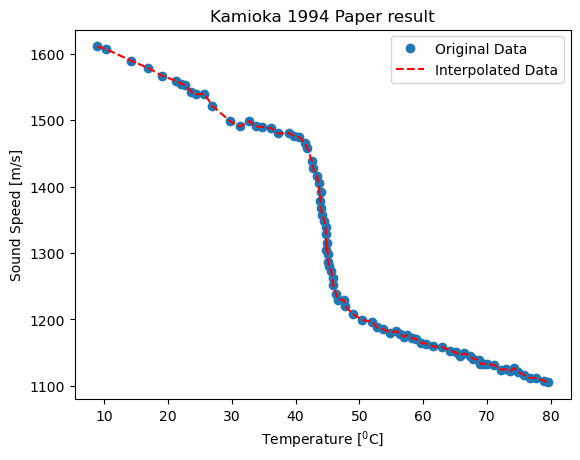

In [2]:
# matData = loadmat('data/tempSpeedKamioka_wax_melting.mat')
matData = loadmat('data/tempSpeedKamioka_wax_solidification.mat')

#matData.values()
list_of_dict_values = list(matData.values())

temp_profiles_Kamioka_orig = [item[0] for item in list_of_dict_values[3]]
spd_profiles_Kamioka_orig = [item[1] for item in list_of_dict_values[3]]


# Interpolate the 
# Sample data: x and y arrays with 50 data points
x = np.array(temp_profiles_Kamioka_orig) # Temperature from Kamioka Paper])
y = np.array(spd_profiles_Kamioka_orig)  # Sound Speed from Kamioka Paper

# Create a new x array with 1000 points (higher resolution)
no_points=5000
x_new = np.linspace(x.min(), x.max(), no_points)

# Interpolation function: Cubic interpolation for smooth results
f = interp1d(x, y)

# Get the new y values based on the interpolated function
y_new = f(x_new)

# Optional: Plot to visualize the increased resolution
plt.plot(x, y, 'o', label='Original Data')
plt.plot(x_new, y_new, '--r', label='Interpolated Data')
plt.title('Kamioka 1994 Paper result')
plt.xlabel('Temperature [$^0$C]')
plt.ylabel('Sound Speed [m/s]')
plt.legend()
plt.show()

spd_profiles_Kamioka = y_new
temp_profiles_Kamioka = x_new 

### Load Experimental TC data for Wax
About the data:
- 1st row is header
- 1st column is bursttime
- 2nd column is referecne temperature
- 3rd to 10 column are temperature for 8 TC

In [3]:
# Load thermocouple data from csv file
# fileNameWax = 'wax_TC_data_20180425104146.csv'
# fileNameWax = 'data/WaxSelected1MinAbhishek.csv'
# fileNameWax = 'data/WaxAllTempData.csv'
fileNameWax = 'data/WaxSelectedWaveformTime.csv'

TCtemp_exp_all = np.loadtxt(fileNameWax, delimiter=",", dtype=str)

display(TCtemp_exp_all)
print('Dimension = ', TCtemp_exp_all.ndim)
print('Shape = ', TCtemp_exp_all.shape)
print('Size = ', TCtemp_exp_all.size)

# As first row is the header, delete the header
# x = np.delete(TCtemp_exp_all, (0), axis=0)
# print('Shape = ', x.shape)
# plt.figure()
# plt.plot(x[burstIndex,1:])


array([['Time', 'Reference', '81 mm', ..., '34.5 mm', '24.5 mm', '15 mm'],
       ['10:41:58', '25.13', '28.11', ..., '27.63', '27.69', '27.62'],
       ['10:42:26', '25.14', '28.12', ..., '27.63', '27.69', '27.6'],
       ...,
       ['13:48:54', '26.42', '97.01', ..., '97.22', '97.13', '97.1'],
       ['13:49:22', '26.42', '97.1', ..., '97.34', '97.24', '97.21'],
       ['13:49:50', '26.42', '97.18', ..., '97.39', '97.32', '97.3']],
      dtype='<U9')

Dimension =  2
Shape =  (404, 10)
Size =  4040


### Plot experimental Temperature obtained from TC

In [4]:
burstIndex = 1 # donot consider 0 index, as it is a header!

TCtemp_exp_all[burstIndex,2:]  # do not consider 1st column as its a time. Also donot consider 2nd column as its reference

burstTime = TCtemp_exp_all[burstIndex,0].replace(':', '_')

print('Thermocouple temperature at time =',burstTime)
print( TCtemp_exp_all[burstIndex,2:])

# for i in range(2,10):
#     plt.plot(TCtemp_exp_all[:,i])
# plt.show()
# plt.plot(TCtemp_exp_all[1:,2],'.')
# plt.plot(TCtemp_exp_all[1:,3],'.')
# plt.plot(TCtemp_exp_all[1:,4],'.')
# plt.plot(TCtemp_exp_all[1:,5],'.')
# plt.plot(TCtemp_exp_all[1:,6],'.')
# plt.plot(TCtemp_exp_all[1:,7],'.')

# plt.show()

Thermocouple temperature at time = 10_41_58
['28.11' '28.04' '28.11' '28.02' '27.94' '27.63' '27.69' '27.62']


# traveltime tomography: Forward and inverse model

burstIndex =  1 ; burstTime =  10_41_58


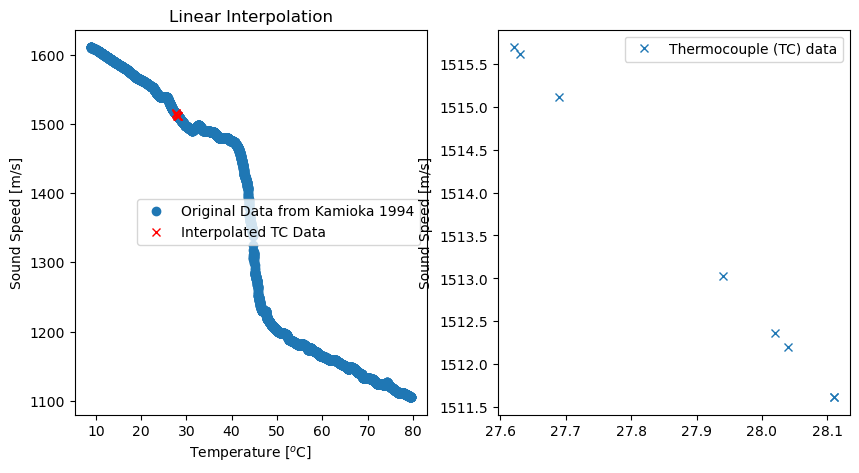

10/02/25 - 10:05:40 - pyGIMLi - INFO - Simulate Traveltime
10/02/25 - 10:05:40 - pyGIMLi - INFO - Creating refined mesh (secnodes: 4) to solve forward task.
10/02/25 - 10:05:44 - pyGIMLi - INFO - Found 1 regions.
10/02/25 - 10:05:44 - pyGIMLi - INFO - Creating forward mesh from region infos.
10/02/25 - 10:05:44 - pyGIMLi - INFO - Creating refined mesh (secnodes: 3) to solve forward task.
10/02/25 - 10:05:44 - pyGIMLi - INFO - Create constant starting model: 0.0006642849213387562
10/02/25 - 10:05:44 - pyGIMLi - INFO - Created startmodel from forward operator:6948, min/max=0.000664/0.000664
10/02/25 - 10:05:44 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.traveltime.modelling.FatrayDijkstraModellingInterpolate object at 0x000001B3CC51EC70>
Data transformation: Identity transform
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 9.2e-06/1.2e-04
min/max (error): 3.59%/4.62%
min/max (start model): 6.6e-04/6.6e-04
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =    1.00
--------------------------------------------------------------------------------
chi² =    0.90 (dPhi = 9.59%) lam: 1500.0


################################################################################
#                  Abort criterion reached: chi² <= 1 (0.90)                   #
################################################################################


C:\Users\376189\Anaconda3\envs\pg\lib\site-packages\pygimli\viewer\mpl\utils.py:165: UserWarning: The figure layout has changed to tight
  ax.figure.tight_layout()



MAE Vertical and Horizontal:  3.66 16.17


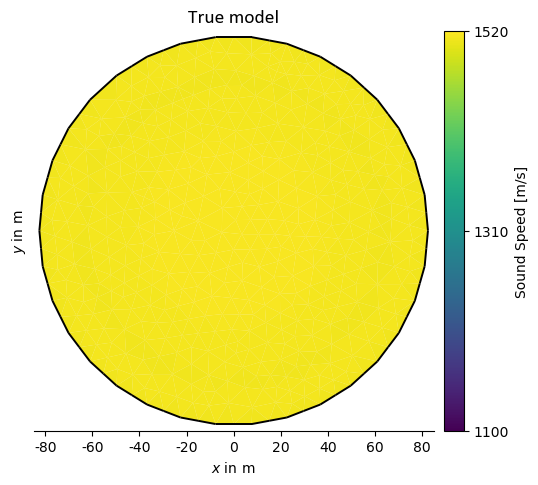

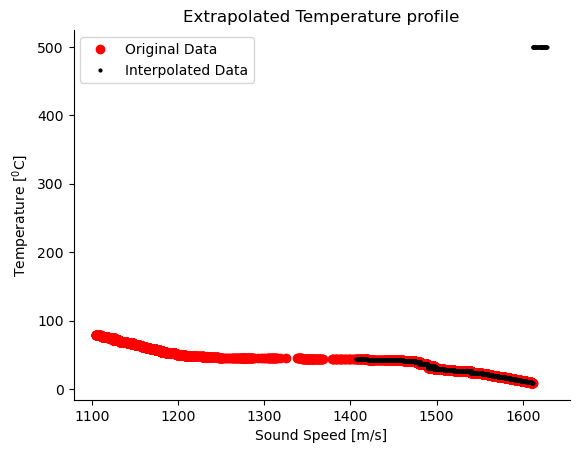

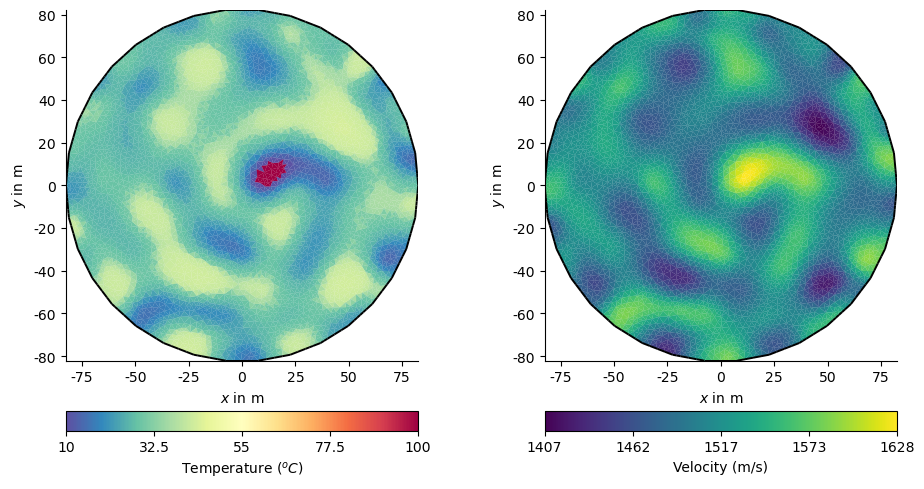

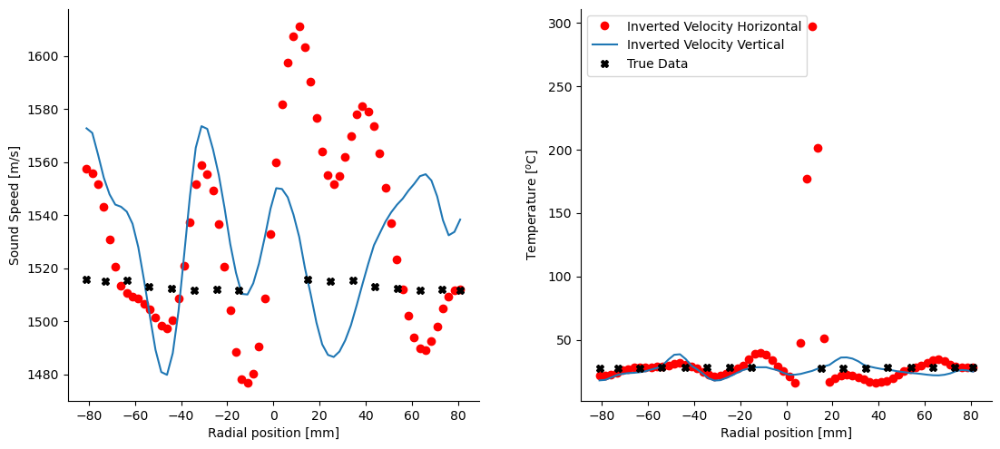

MAE Vertical and Horizontal:  4.45 10.01


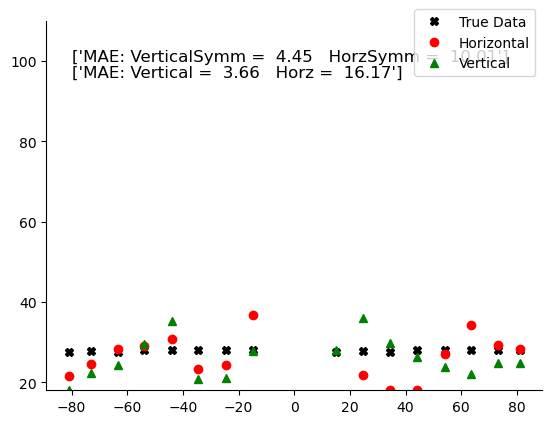

Radial position =  [-15.  -24.5 -34.5 -44.  -54.  -63.5 -73.  -81.   15.   24.5  34.5  44.
  54.   63.5  73.   81. ]
True TC temperature =  [28.11 28.04 28.11 28.02 27.94 27.63 27.69 27.62 27.62 27.69 27.63 27.94
 28.02 28.11 28.04 28.11]
Horizontal Temperature = [ 36.84  24.4   23.4   30.74  29.05  28.24  24.45  21.52 123.31  21.9
  18.03  18.14  27.08  34.18  29.35  28.24]
Vertical Temperature = [27.8  21.12 20.79 35.35 29.58 24.41 22.25 17.96 28.11 36.   29.7  26.34
 23.77 22.02 24.81 24.87]
MAE Vertical and Horizontal:  4.45 10.01
burstIndex =  2 ; burstTime =  10_42_26


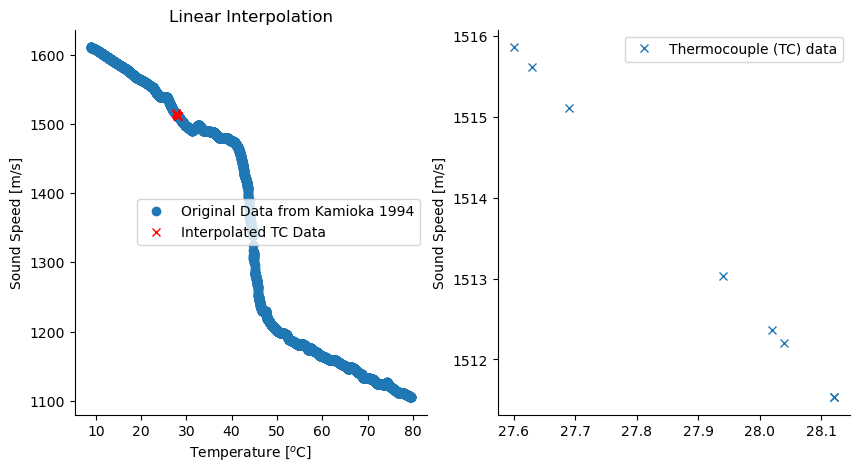

10/02/25 - 10:07:07 - pyGIMLi - INFO - Simulate Traveltime
10/02/25 - 10:07:08 - pyGIMLi - INFO - Creating refined mesh (secnodes: 4) to solve forward task.
10/02/25 - 10:07:12 - pyGIMLi - INFO - Found 1 regions.
10/02/25 - 10:07:12 - pyGIMLi - INFO - Creating forward mesh from region infos.
10/02/25 - 10:07:12 - pyGIMLi - INFO - Creating refined mesh (secnodes: 3) to solve forward task.
10/02/25 - 10:07:12 - pyGIMLi - INFO - Create constant starting model: 0.0006643059839903546
10/02/25 - 10:07:12 - pyGIMLi - INFO - Created startmodel from forward operator:6948, min/max=0.000664/0.000664
10/02/25 - 10:07:12 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.traveltime.modelling.FatrayDijkstraModellingInterpolate object at 0x000001B432BC5F90>
Data transformation: Identity transform
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 9.2e-06/1.2e-04
min/max (error): 3.59%/4.62%
min/max (start model): 6.6e-04/6.6e-04
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =    1.00
--------------------------------------------------------------------------------
chi² =    0.90 (dPhi = 9.60%) lam: 1500.0


################################################################################
#                  Abort criterion reached: chi² <= 1 (0.90)                   #
################################################################################


C:\Users\376189\Anaconda3\envs\pg\lib\site-packages\pygimli\viewer\mpl\utils.py:165: UserWarning: The figure layout has changed to tight
  ax.figure.tight_layout()



MAE Vertical and Horizontal:  3.69 16.21


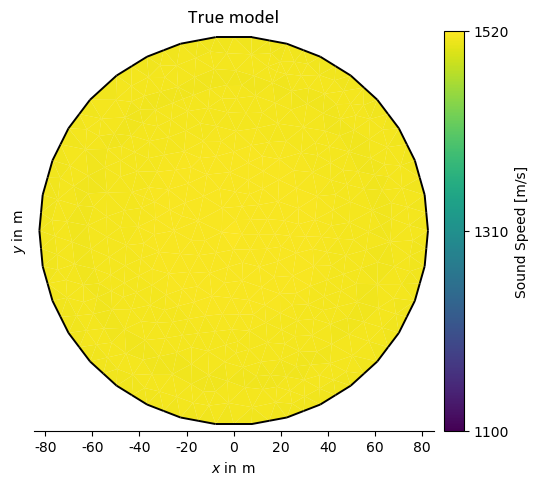

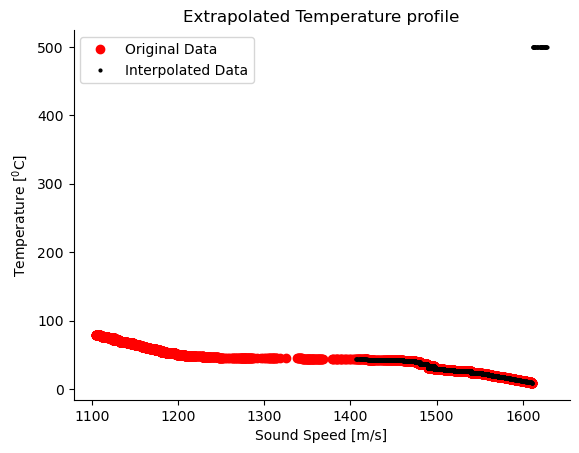

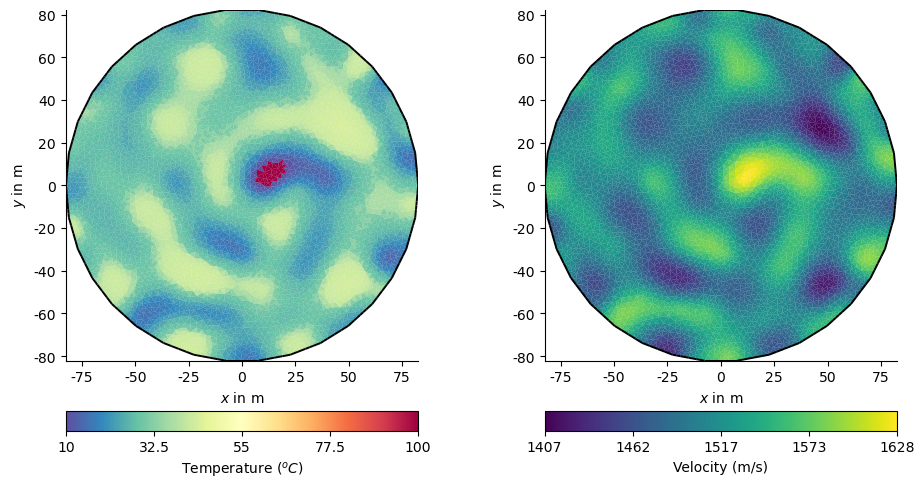

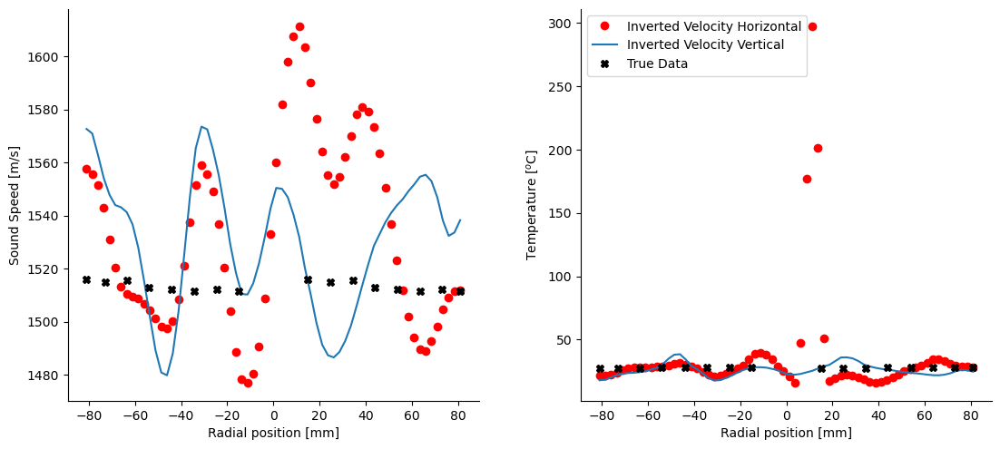

MAE Vertical and Horizontal:  4.48 10.02


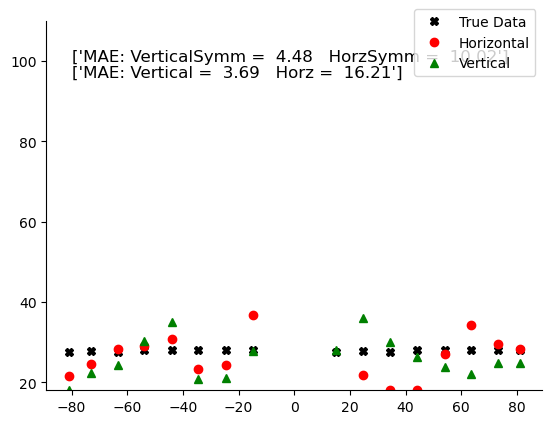

Radial position =  [-15.  -24.5 -34.5 -44.  -54.  -63.5 -73.  -81.   15.   24.5  34.5  44.
  54.   63.5  73.   81. ]
True TC temperature =  [28.12 28.04 28.12 28.02 27.94 27.63 27.69 27.6  27.6  27.69 27.63 27.94
 28.02 28.12 28.04 28.12]
Horizontal Temperature = [ 36.63  24.4   23.4   30.69  29.09  28.24  24.45  21.53 123.3   21.9
  18.03  18.14  27.08  34.32  29.57  28.25]
Vertical Temperature = [27.79 21.12 20.79 35.04 30.2  24.4  22.26 17.98 28.07 36.   29.91 26.34
 23.77 22.03 24.81 24.87]
MAE Vertical and Horizontal:  4.48 10.02
burstIndex =  3 ; burstTime =  10_42_54


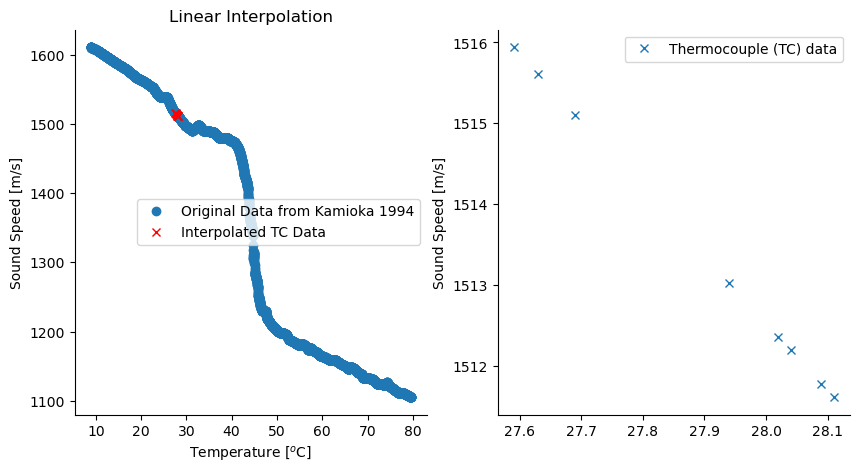

10/02/25 - 10:08:44 - pyGIMLi - INFO - Simulate Traveltime
10/02/25 - 10:08:45 - pyGIMLi - INFO - Creating refined mesh (secnodes: 4) to solve forward task.
10/02/25 - 10:08:50 - pyGIMLi - INFO - Found 1 regions.
10/02/25 - 10:08:50 - pyGIMLi - INFO - Creating forward mesh from region infos.
10/02/25 - 10:08:50 - pyGIMLi - INFO - Creating refined mesh (secnodes: 3) to solve forward task.
10/02/25 - 10:08:50 - pyGIMLi - INFO - Create constant starting model: 0.0006642840118984217
10/02/25 - 10:08:50 - pyGIMLi - INFO - Created startmodel from forward operator:6948, min/max=0.000664/0.000664
10/02/25 - 10:08:50 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.traveltime.modelling.FatrayDijkstraModellingInterpolate object at 0x000001B432BF3E00>
Data transformation: Identity transform
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 9.2e-06/1.2e-04
min/max (error): 3.59%/4.62%
min/max (start model): 6.6e-04/6.6e-04
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =    1.00
--------------------------------------------------------------------------------
chi² =    0.90 (dPhi = 9.61%) lam: 1500.0


################################################################################
#                  Abort criterion reached: chi² <= 1 (0.90)                   #
################################################################################


C:\Users\376189\Anaconda3\envs\pg\lib\site-packages\pygimli\viewer\mpl\utils.py:165: UserWarning: The figure layout has changed to tight
  ax.figure.tight_layout()



MAE Vertical and Horizontal:  3.67 16.24


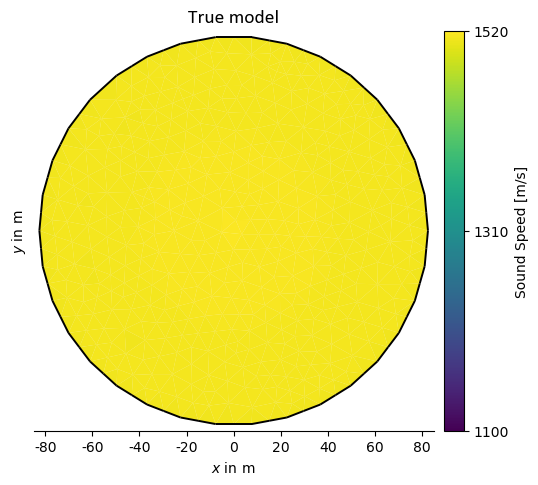

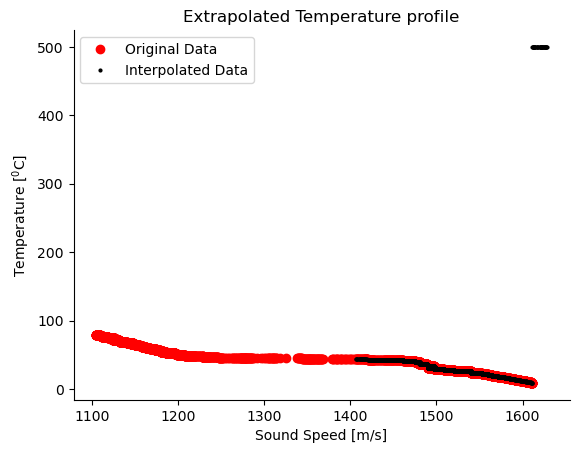

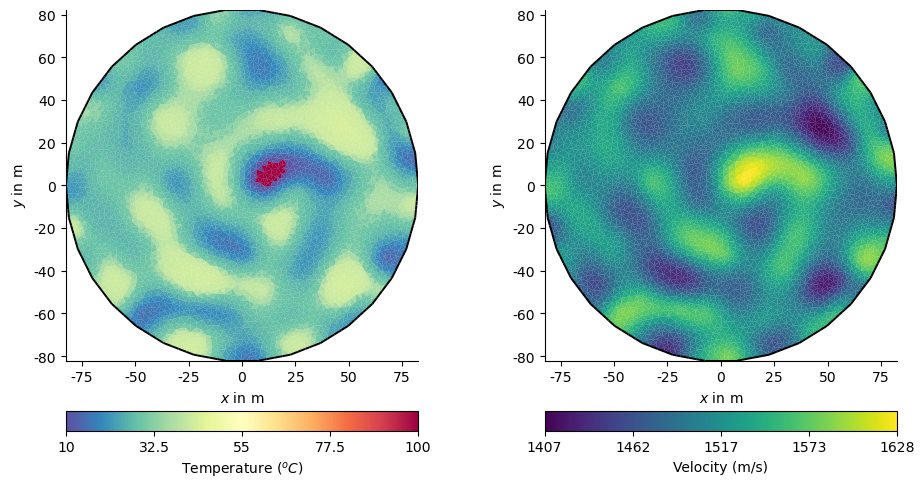

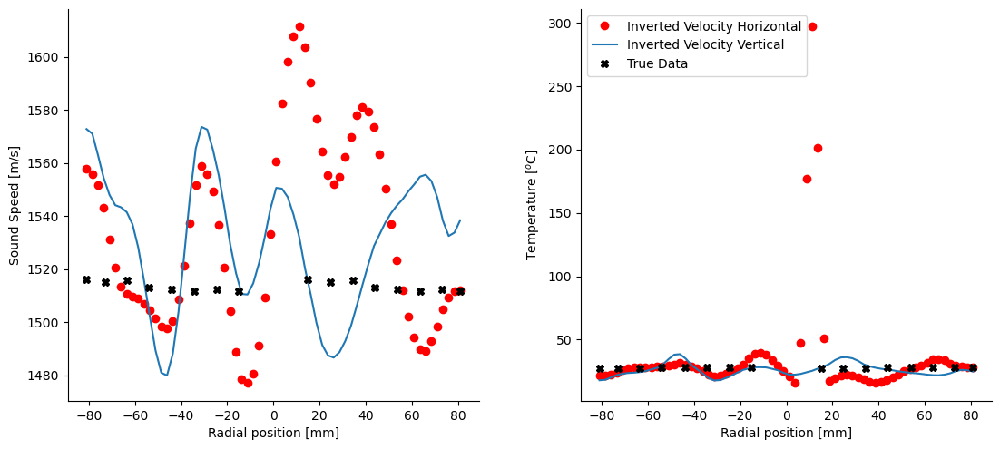

MAE Vertical and Horizontal:  4.48 10.05


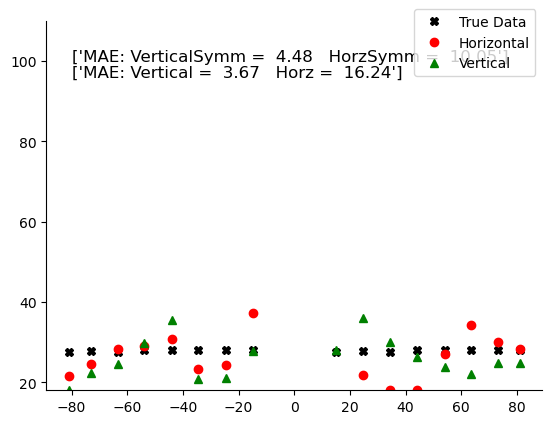

Radial position =  [-15.  -24.5 -34.5 -44.  -54.  -63.5 -73.  -81.   15.   24.5  34.5  44.
  54.   63.5  73.   81. ]
True TC temperature =  [28.11 28.04 28.09 28.02 27.94 27.63 27.69 27.59 27.59 27.69 27.63 27.94
 28.02 28.09 28.04 28.11]
Horizontal Temperature = [ 37.12  24.4   23.4   30.69  28.93  28.23  24.45  21.52 123.28  21.89
  18.03  18.14  27.08  34.18  29.9   28.24]
Vertical Temperature = [27.78 21.11 20.8  35.56 29.86 24.43 22.25 17.96 27.96 36.01 29.91 26.34
 23.76 22.   24.81 24.87]
MAE Vertical and Horizontal:  4.48 10.05
burstIndex =  4 ; burstTime =  10_43_22


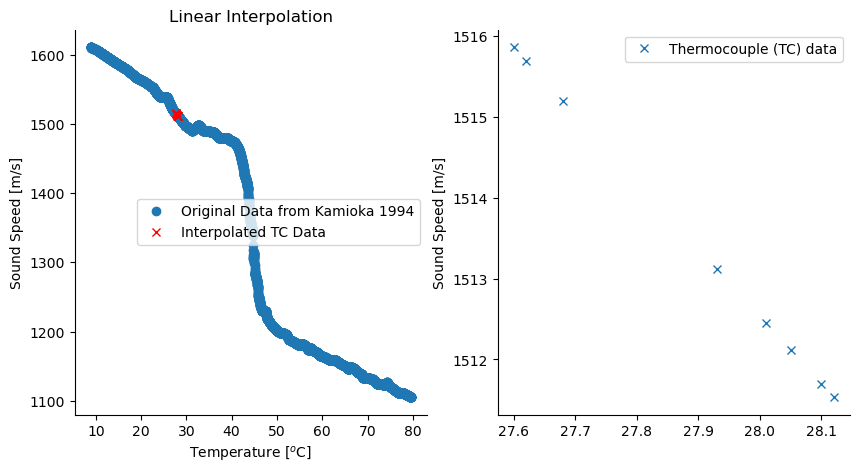

10/02/25 - 10:10:31 - pyGIMLi - INFO - Simulate Traveltime
10/02/25 - 10:10:32 - pyGIMLi - INFO - Creating refined mesh (secnodes: 4) to solve forward task.
10/02/25 - 10:10:37 - pyGIMLi - INFO - Found 1 regions.
10/02/25 - 10:10:37 - pyGIMLi - INFO - Creating forward mesh from region infos.
10/02/25 - 10:10:37 - pyGIMLi - INFO - Creating refined mesh (secnodes: 3) to solve forward task.
10/02/25 - 10:10:37 - pyGIMLi - INFO - Create constant starting model: 0.0006643064357107092
10/02/25 - 10:10:37 - pyGIMLi - INFO - Created startmodel from forward operator:6948, min/max=0.000664/0.000664
10/02/25 - 10:10:37 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.traveltime.modelling.FatrayDijkstraModellingInterpolate object at 0x000001B3CBB16D10>
Data transformation: Identity transform
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 9.2e-06/1.2e-04
min/max (error): 3.59%/4.62%
min/max (start model): 6.6e-04/6.6e-04
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =    1.00
--------------------------------------------------------------------------------
chi² =    0.90 (dPhi = 9.61%) lam: 1500.0


################################################################################
#                  Abort criterion reached: chi² <= 1 (0.90)                   #
################################################################################


C:\Users\376189\Anaconda3\envs\pg\lib\site-packages\pygimli\viewer\mpl\utils.py:165: UserWarning: The figure layout has changed to tight
  ax.figure.tight_layout()



MAE Vertical and Horizontal:  3.67 16.21


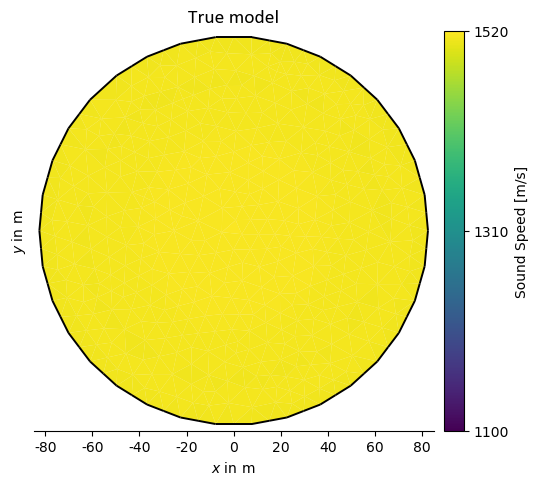

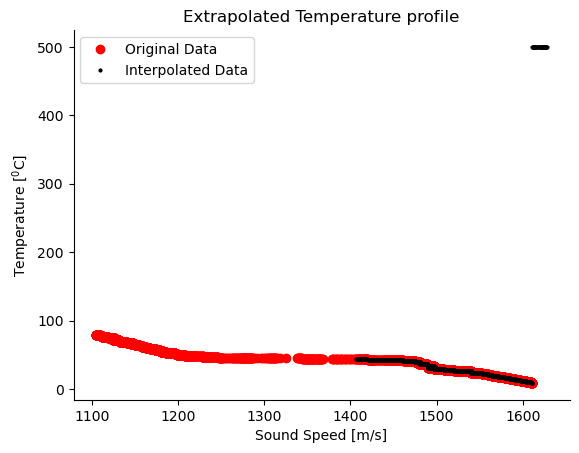

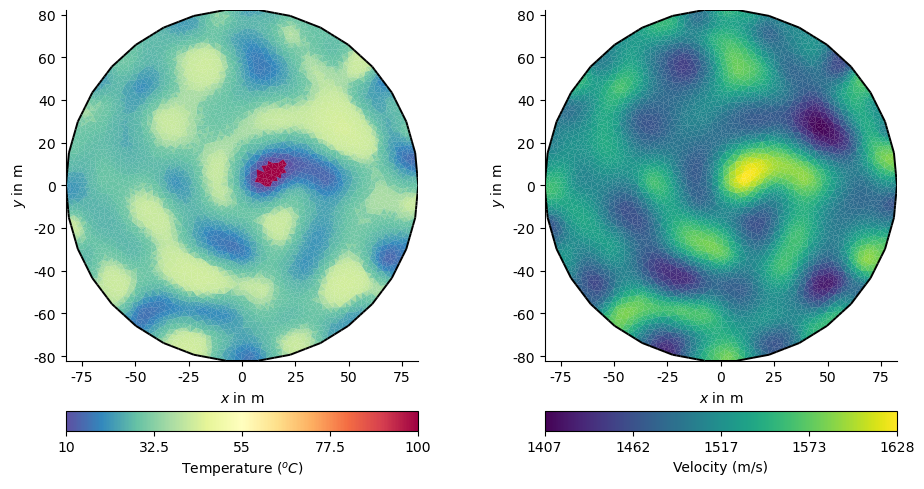

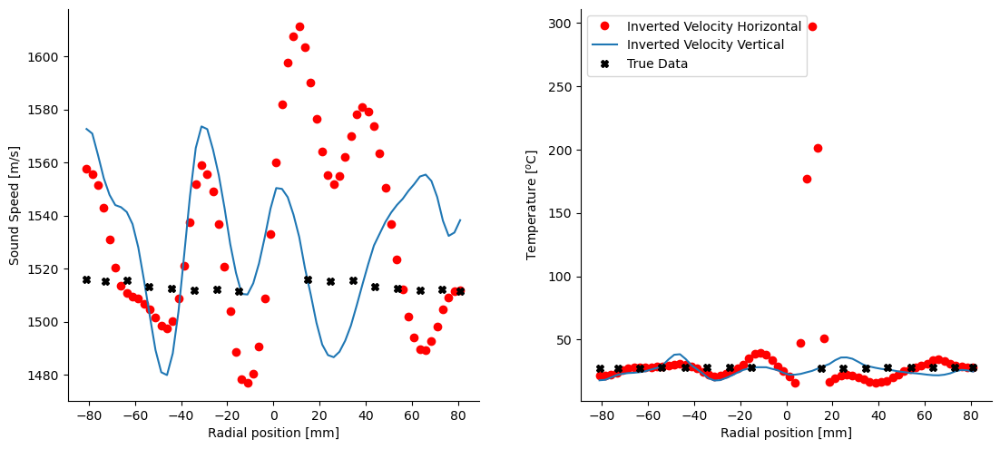

MAE Vertical and Horizontal:  4.45 10.02


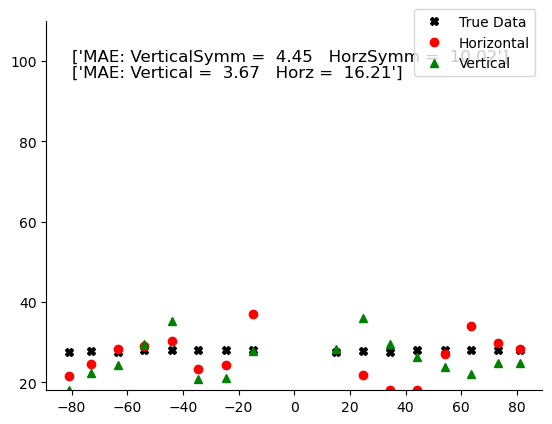

Radial position =  [-15.  -24.5 -34.5 -44.  -54.  -63.5 -73.  -81.   15.   24.5  34.5  44.
  54.   63.5  73.   81. ]
True TC temperature =  [28.12 28.05 28.1  28.01 27.93 27.62 27.68 27.6  27.6  27.68 27.62 27.93
 28.01 28.1  28.05 28.12]
Horizontal Temperature = [ 37.1   24.41  23.4   30.35  29.08  28.23  24.46  21.54 123.29  21.89
  18.02  18.13  27.07  34.06  29.79  28.26]
Vertical Temperature = [27.79 21.11 20.78 35.32 29.57 24.41 22.26 17.98 28.21 35.97 29.64 26.34
 23.76 22.01 24.81 24.87]
MAE Vertical and Horizontal:  4.45 10.02
burstIndex =  5 ; burstTime =  10_43_50


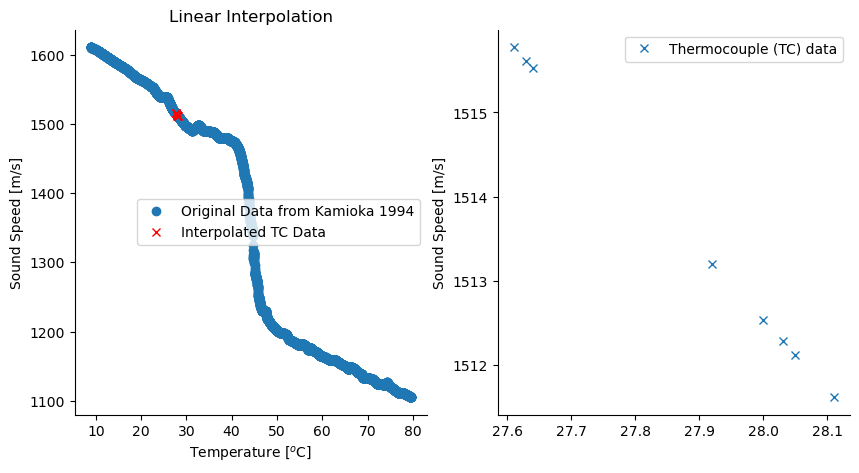

10/02/25 - 10:12:25 - pyGIMLi - INFO - Simulate Traveltime
10/02/25 - 10:12:25 - pyGIMLi - INFO - Creating refined mesh (secnodes: 4) to solve forward task.
10/02/25 - 10:12:31 - pyGIMLi - INFO - Found 1 regions.
10/02/25 - 10:12:31 - pyGIMLi - INFO - Creating forward mesh from region infos.
10/02/25 - 10:12:31 - pyGIMLi - INFO - Creating refined mesh (secnodes: 3) to solve forward task.
10/02/25 - 10:12:32 - pyGIMLi - INFO - Create constant starting model: 0.0006642519603039216
10/02/25 - 10:12:32 - pyGIMLi - INFO - Created startmodel from forward operator:6948, min/max=0.000664/0.000664
10/02/25 - 10:12:32 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.traveltime.modelling.FatrayDijkstraModellingInterpolate object at 0x000001B405D123B0>
Data transformation: Identity transform
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 9.2e-06/1.2e-04
min/max (error): 3.59%/4.62%
min/max (start model): 6.6e-04/6.6e-04
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =    1.00
--------------------------------------------------------------------------------
chi² =    0.90 (dPhi = 9.61%) lam: 1500.0


################################################################################
#                  Abort criterion reached: chi² <= 1 (0.90)                   #
################################################################################


C:\Users\376189\Anaconda3\envs\pg\lib\site-packages\pygimli\viewer\mpl\utils.py:165: UserWarning: The figure layout has changed to tight
  ax.figure.tight_layout()



MAE Vertical and Horizontal:  3.67 16.21


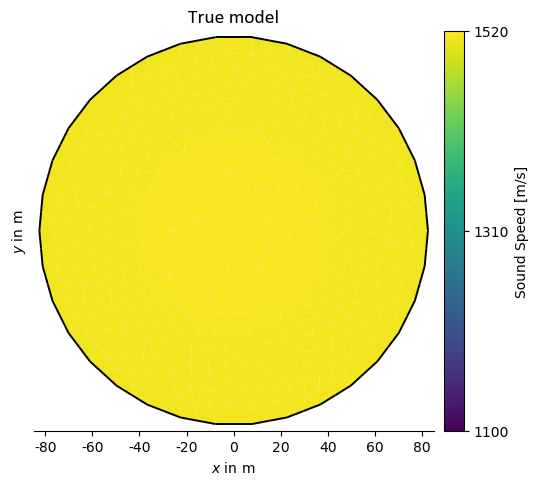

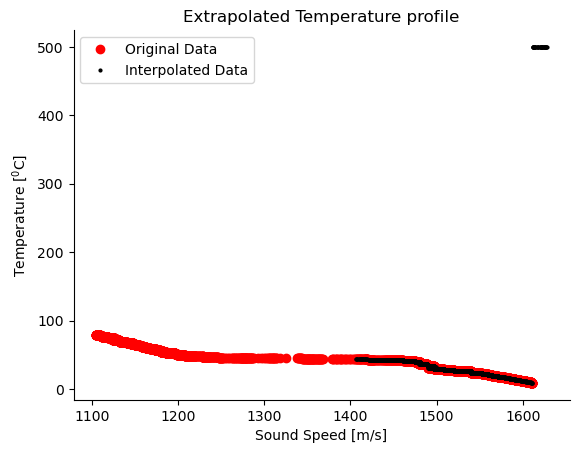

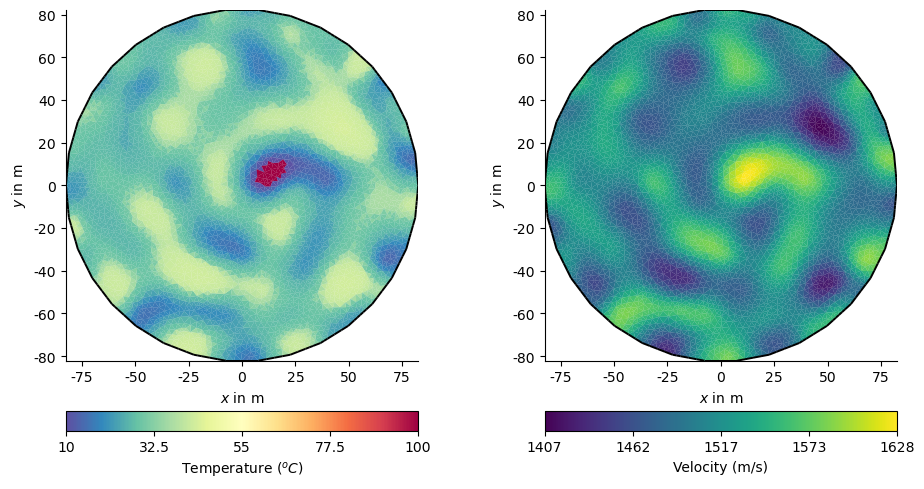

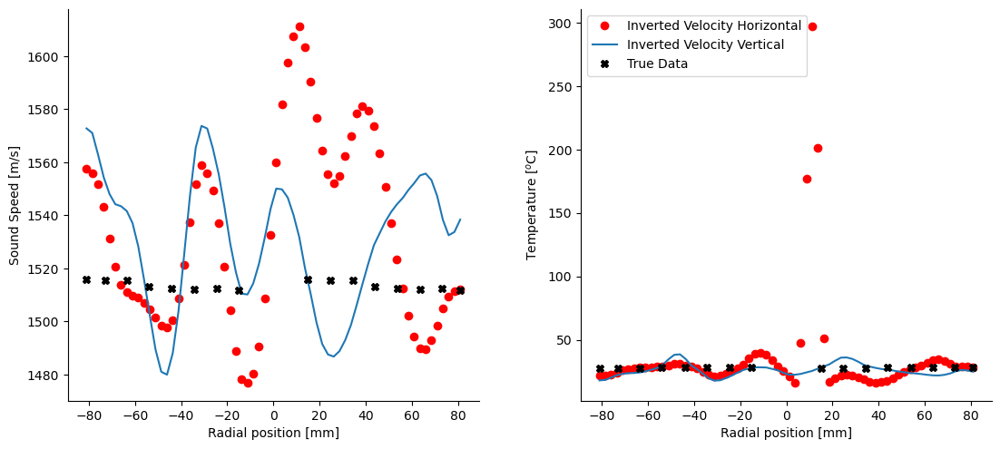

MAE Vertical and Horizontal:  4.48 10.01


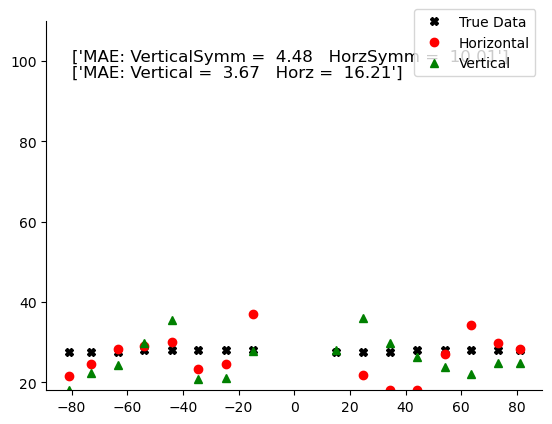

Radial position =  [-15.  -24.5 -34.5 -44.  -54.  -63.5 -73.  -81.   15.   24.5  34.5  44.
  54.   63.5  73.   81. ]
True TC temperature =  [28.11 28.03 28.05 28.   27.92 27.63 27.64 27.61 27.61 27.64 27.63 27.92
 28.   28.05 28.03 28.11]
Horizontal Temperature = [ 37.1   24.42  23.39  30.14  29.06  28.2   24.44  21.52 123.29  21.87
  18.    18.11  27.06  34.15  29.68  28.24]
Vertical Temperature = [27.79 21.08 20.77 35.38 29.84 24.22 22.24 17.96 28.12 35.94 29.73 26.33
 23.73 21.95 24.8  24.86]
MAE Vertical and Horizontal:  4.48 10.01
burstIndex =  6 ; burstTime =  10_44_18


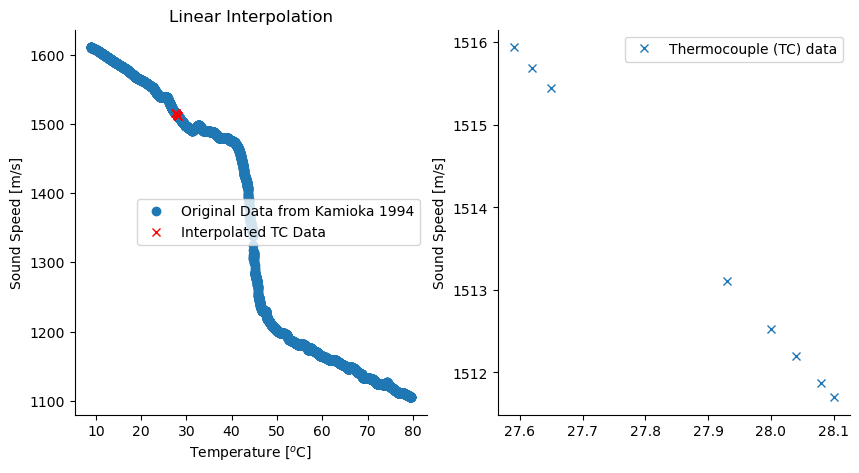

10/02/25 - 10:14:25 - pyGIMLi - INFO - Simulate Traveltime
10/02/25 - 10:14:26 - pyGIMLi - INFO - Creating refined mesh (secnodes: 4) to solve forward task.
10/02/25 - 10:14:32 - pyGIMLi - INFO - Found 1 regions.
10/02/25 - 10:14:32 - pyGIMLi - INFO - Creating forward mesh from region infos.
10/02/25 - 10:14:32 - pyGIMLi - INFO - Creating refined mesh (secnodes: 3) to solve forward task.
10/02/25 - 10:14:32 - pyGIMLi - INFO - Create constant starting model: 0.0006642578809300408
10/02/25 - 10:14:32 - pyGIMLi - INFO - Created startmodel from forward operator:6948, min/max=0.000664/0.000664
10/02/25 - 10:14:32 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.traveltime.modelling.FatrayDijkstraModellingInterpolate object at 0x000001B49A7CF360>
Data transformation: Identity transform
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 9.2e-06/1.2e-04
min/max (error): 3.59%/4.62%
min/max (start model): 6.6e-04/6.6e-04
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =    1.00
--------------------------------------------------------------------------------
chi² =    0.90 (dPhi = 9.61%) lam: 1500.0


################################################################################
#                  Abort criterion reached: chi² <= 1 (0.90)                   #
################################################################################


C:\Users\376189\Anaconda3\envs\pg\lib\site-packages\pygimli\viewer\mpl\utils.py:165: UserWarning: The figure layout has changed to tight
  ax.figure.tight_layout()



MAE Vertical and Horizontal:  3.65 16.25


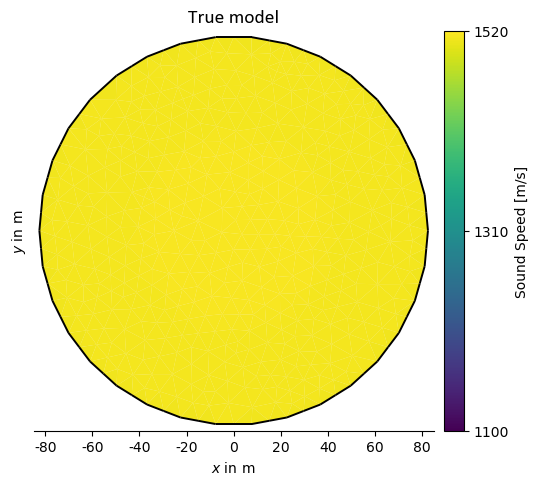

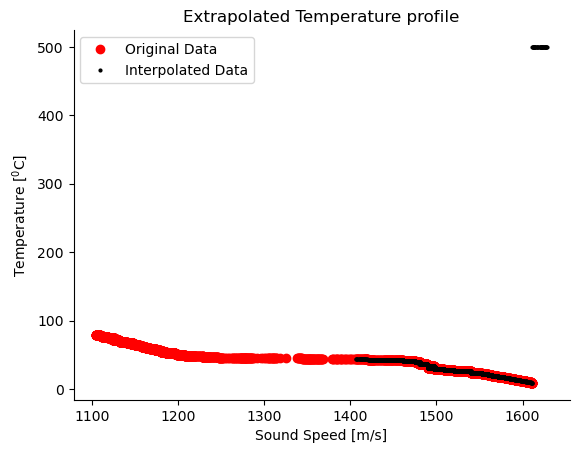

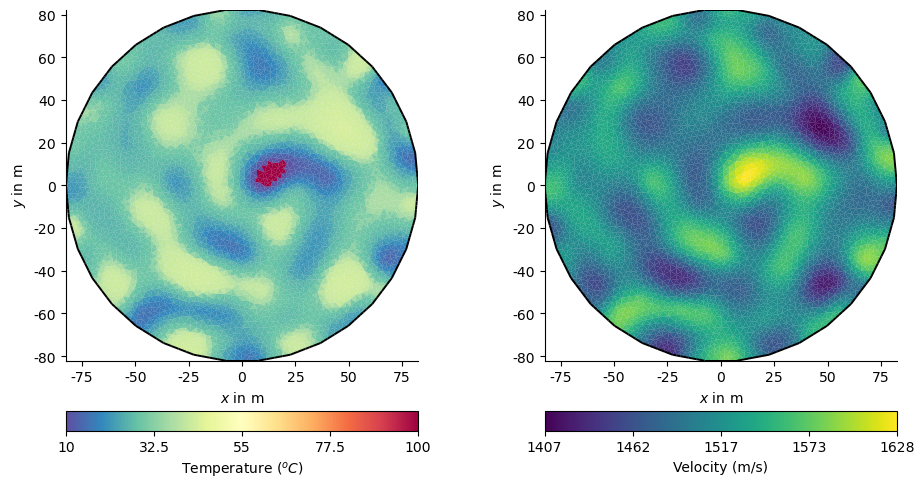

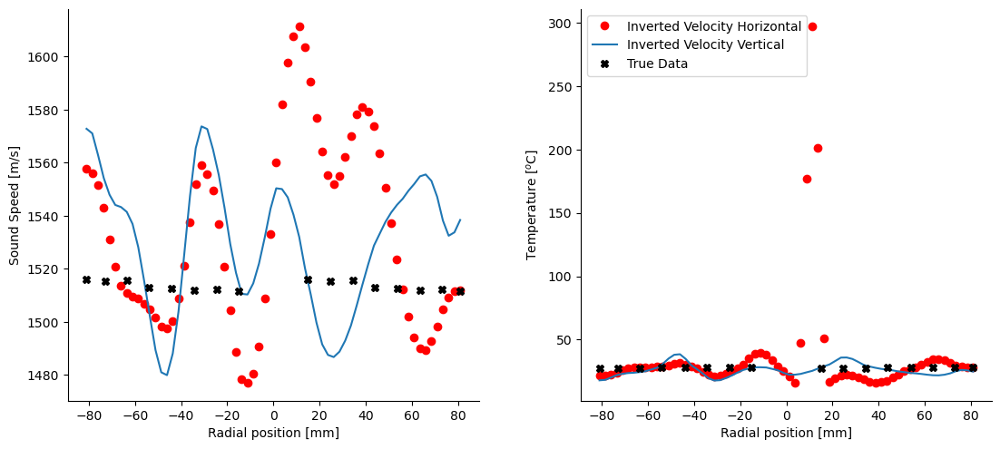

MAE Vertical and Horizontal:  4.49 10.05


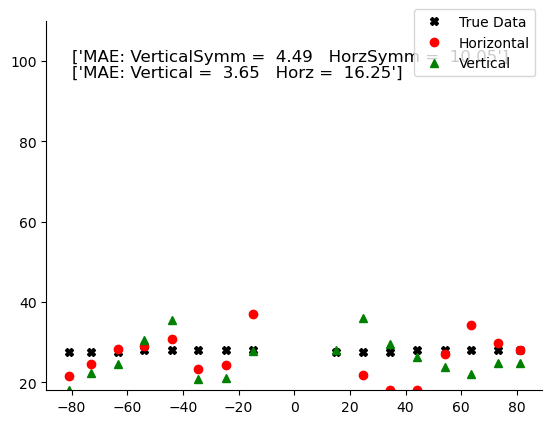

Radial position =  [-15.  -24.5 -34.5 -44.  -54.  -63.5 -73.  -81.   15.   24.5  34.5  44.
  54.   63.5  73.   81. ]
True TC temperature =  [28.1  28.04 28.08 28.   27.93 27.62 27.65 27.59 27.59 27.65 27.62 27.93
 28.   28.08 28.04 28.1 ]
Horizontal Temperature = [ 36.87  24.32  23.39  30.68  29.03  28.22  24.45  21.5  123.27  21.87
  18.    18.12  27.06  34.35  29.89  28.14]
Vertical Temperature = [27.78 21.08 20.77 35.38 30.39 24.45 22.24 17.95 28.09 35.91 29.62 26.33
 23.74 21.98 24.81 24.86]
MAE Vertical and Horizontal:  4.49 10.05
burstIndex =  7 ; burstTime =  10_44_46


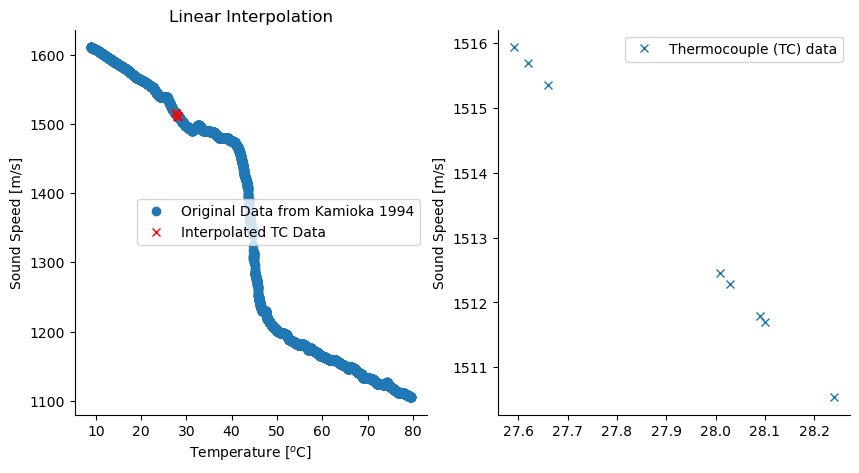

10/02/25 - 10:16:34 - pyGIMLi - INFO - Simulate Traveltime
10/02/25 - 10:16:35 - pyGIMLi - INFO - Creating refined mesh (secnodes: 4) to solve forward task.
10/02/25 - 10:16:40 - pyGIMLi - INFO - Found 1 regions.
10/02/25 - 10:16:40 - pyGIMLi - INFO - Creating forward mesh from region infos.
10/02/25 - 10:16:40 - pyGIMLi - INFO - Creating refined mesh (secnodes: 3) to solve forward task.
10/02/25 - 10:16:41 - pyGIMLi - INFO - Create constant starting model: 0.0006642479347707215
10/02/25 - 10:16:41 - pyGIMLi - INFO - Created startmodel from forward operator:6948, min/max=0.000664/0.000664
10/02/25 - 10:16:41 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.traveltime.modelling.FatrayDijkstraModellingInterpolate object at 0x000001B3CBB5D9A0>
Data transformation: Identity transform
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 9.2e-06/1.2e-04
min/max (error): 3.59%/4.62%
min/max (start model): 6.6e-04/6.6e-04
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =    1.00
--------------------------------------------------------------------------------
chi² =    0.90 (dPhi = 9.54%) lam: 1500.0


################################################################################
#                  Abort criterion reached: chi² <= 1 (0.90)                   #
################################################################################


C:\Users\376189\Anaconda3\envs\pg\lib\site-packages\pygimli\viewer\mpl\utils.py:165: UserWarning: The figure layout has changed to tight
  ax.figure.tight_layout()



MAE Vertical and Horizontal:  3.66 16.15


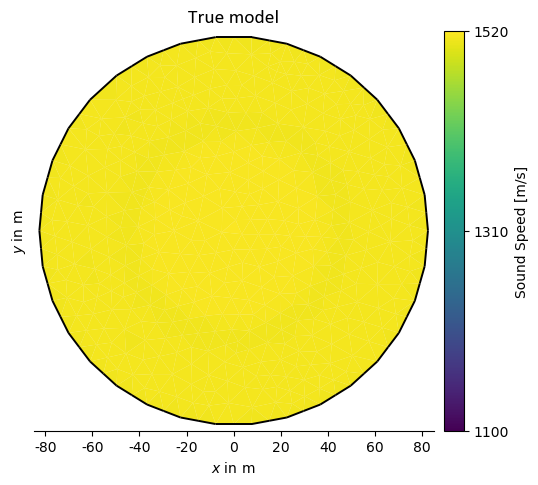

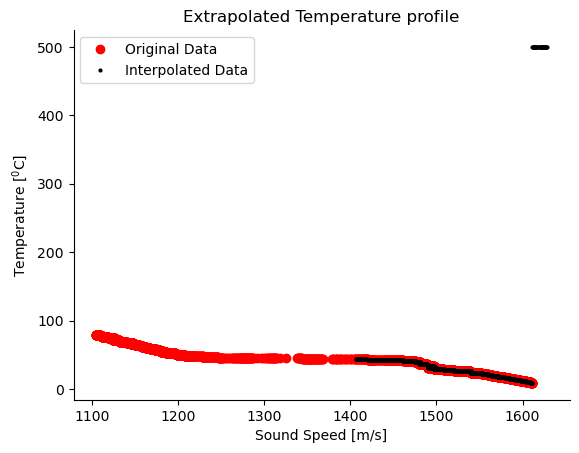

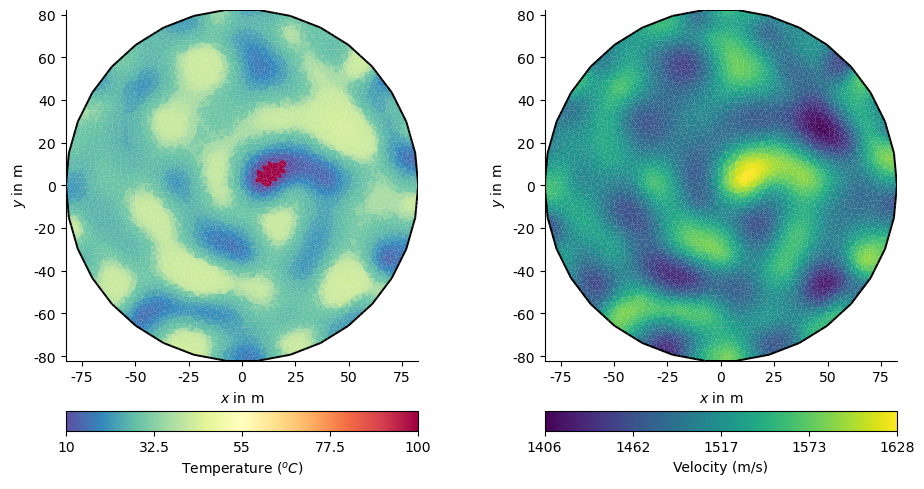

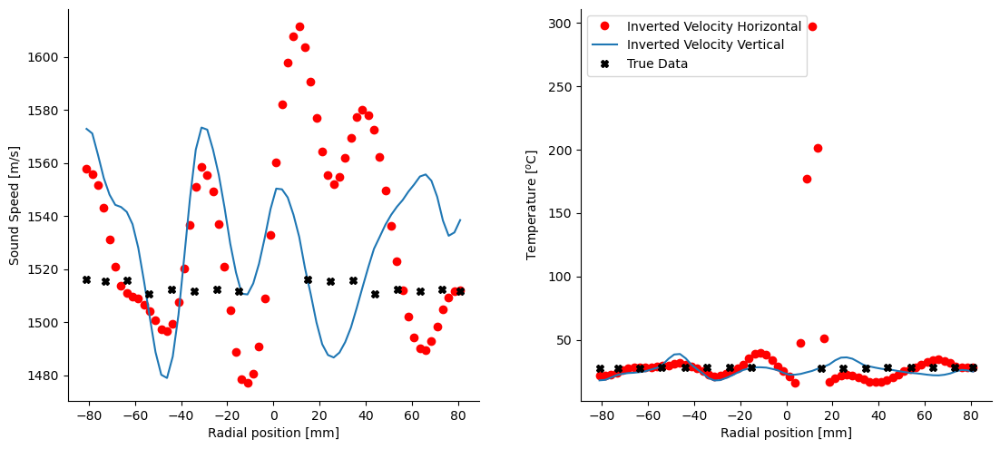

MAE Vertical and Horizontal:  4.47 9.98


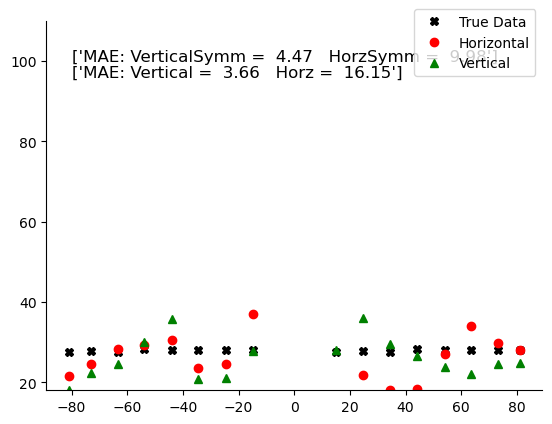

Radial position =  [-15.  -24.5 -34.5 -44.  -54.  -63.5 -73.  -81.   15.   24.5  34.5  44.
  54.   63.5  73.   81. ]
True TC temperature =  [28.1  28.03 28.09 28.01 28.24 27.62 27.66 27.59 27.59 27.66 27.62 28.24
 28.01 28.09 28.03 28.1 ]
Horizontal Temperature = [ 36.87  24.43  23.5   30.61  29.29  28.21  24.44  21.5  123.25  21.87
  18.18  18.36  27.11  33.91  29.67  28.14]
Vertical Temperature = [27.76 21.08 20.89 35.83 29.98 24.46 22.23 17.95 27.91 35.93 29.61 26.45
 23.82 21.98 24.66 24.86]
MAE Vertical and Horizontal:  4.47 9.98
burstIndex =  8 ; burstTime =  10_45_14


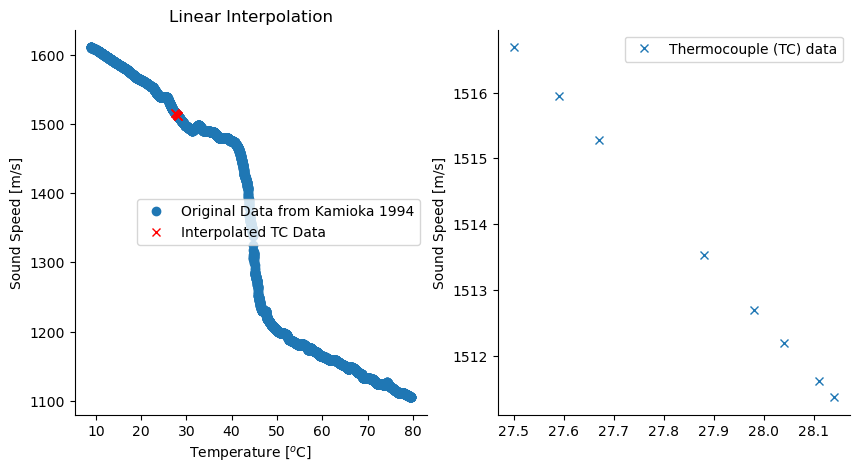

10/02/25 - 10:18:42 - pyGIMLi - INFO - Simulate Traveltime
10/02/25 - 10:18:43 - pyGIMLi - INFO - Creating refined mesh (secnodes: 4) to solve forward task.
10/02/25 - 10:18:49 - pyGIMLi - INFO - Found 1 regions.
10/02/25 - 10:18:49 - pyGIMLi - INFO - Creating forward mesh from region infos.
10/02/25 - 10:18:49 - pyGIMLi - INFO - Creating refined mesh (secnodes: 3) to solve forward task.
10/02/25 - 10:18:50 - pyGIMLi - INFO - Create constant starting model: 0.0006642457008459597
10/02/25 - 10:18:50 - pyGIMLi - INFO - Created startmodel from forward operator:6948, min/max=0.000664/0.000664
10/02/25 - 10:18:50 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.traveltime.modelling.FatrayDijkstraModellingInterpolate object at 0x000001B4749F6E50>
Data transformation: Identity transform
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 9.2e-06/1.2e-04
min/max (error): 3.59%/4.62%
min/max (start model): 6.6e-04/6.6e-04
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =    1.00
--------------------------------------------------------------------------------
chi² =    0.90 (dPhi = 9.59%) lam: 1500.0


################################################################################
#                  Abort criterion reached: chi² <= 1 (0.90)                   #
################################################################################


C:\Users\376189\Anaconda3\envs\pg\lib\site-packages\pygimli\viewer\mpl\utils.py:165: UserWarning: The figure layout has changed to tight
  ax.figure.tight_layout()



MAE Vertical and Horizontal:  3.68 16.17


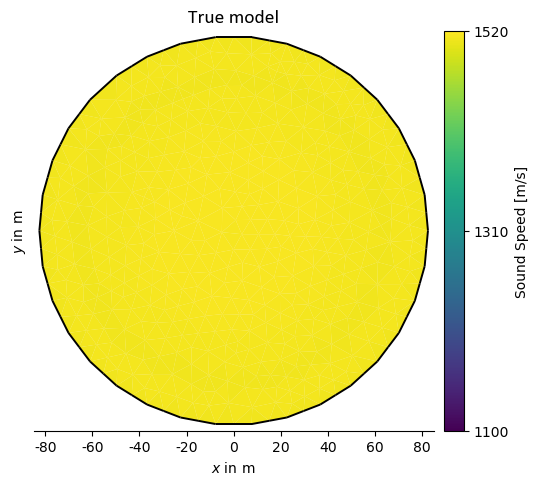

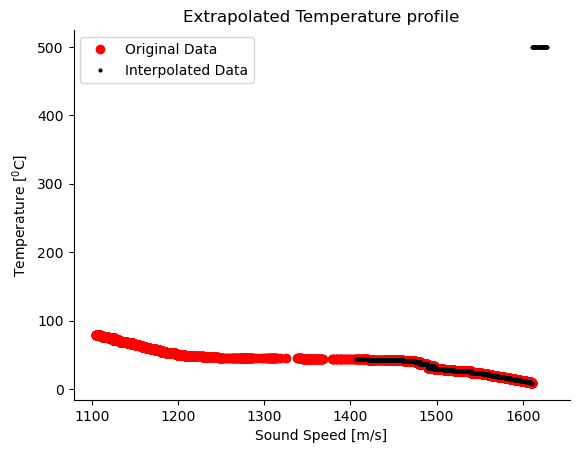

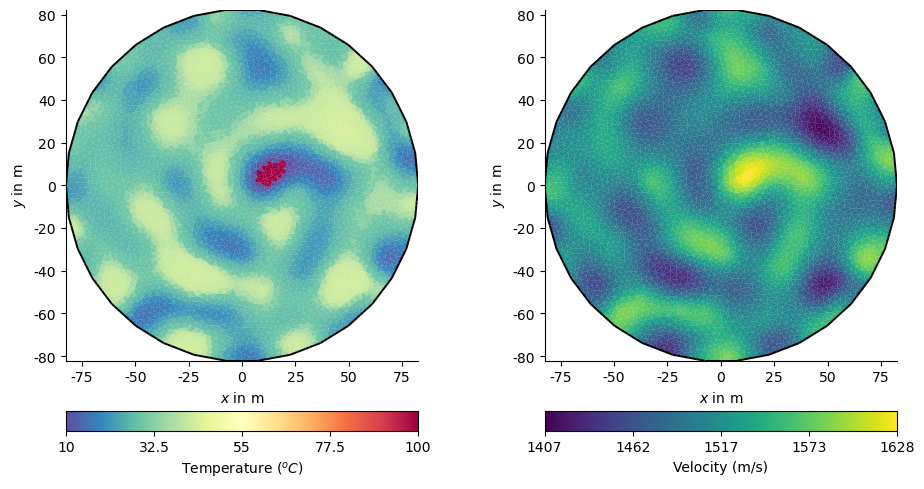

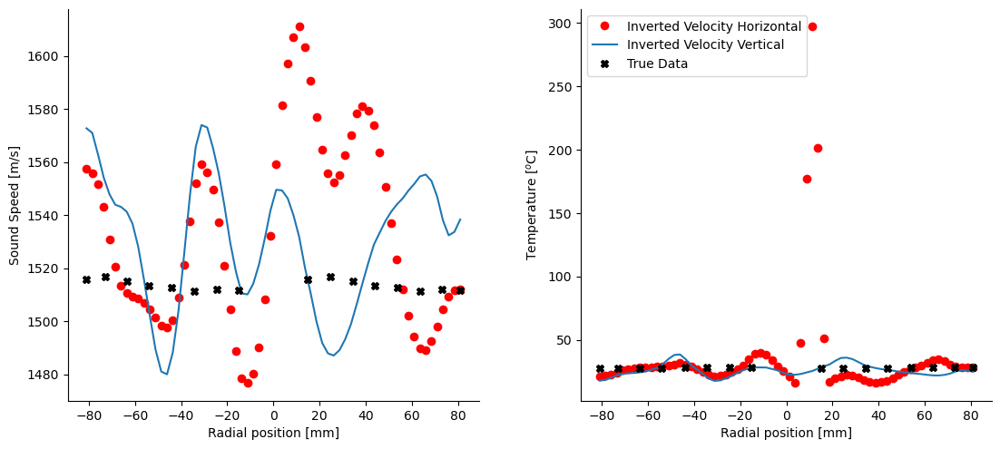

MAE Vertical and Horizontal:  4.51 10.02


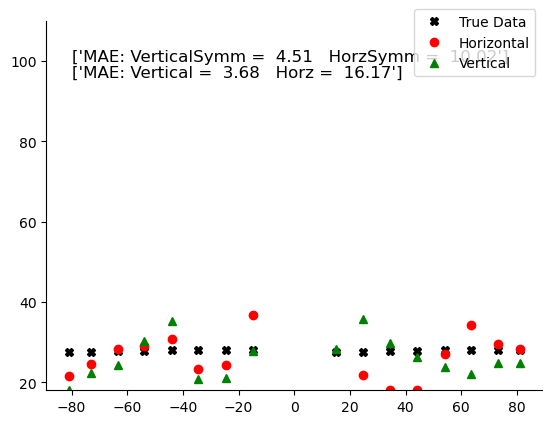

Radial position =  [-15.  -24.5 -34.5 -44.  -54.  -63.5 -73.  -81.   15.   24.5  34.5  44.
  54.   63.5  73.   81. ]
True TC temperature =  [28.11 28.04 28.14 27.98 27.88 27.67 27.5  27.59 27.59 27.5  27.67 27.88
 27.98 28.14 28.04 28.11]
Horizontal Temperature = [ 36.85  24.28  23.28  30.73  29.04  28.25  24.46  21.52 123.25  21.76
  17.95  18.08  27.06  34.14  29.42  28.24]
Vertical Temperature = [27.77 21.02 20.72 35.33 30.27 24.39 22.26 17.96 28.22 35.81 29.8  26.32
 23.75 22.04 24.82 24.86]
MAE Vertical and Horizontal:  4.51 10.02
burstIndex =  9 ; burstTime =  10_45_42


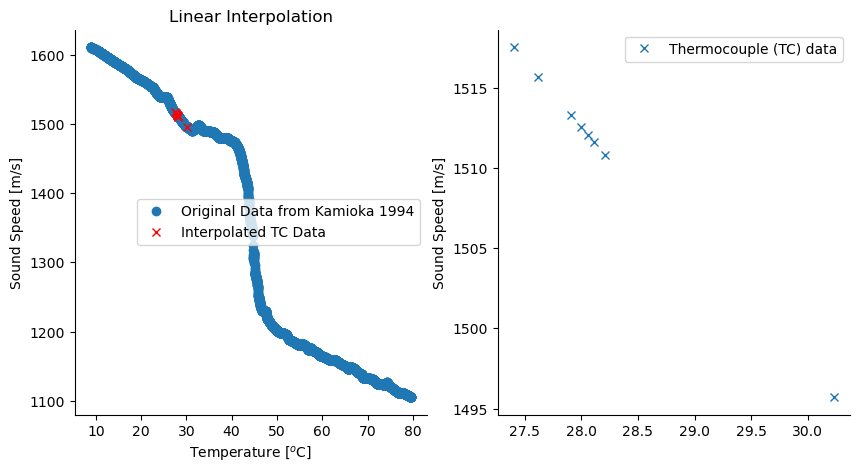

10/02/25 - 10:21:00 - pyGIMLi - INFO - Simulate Traveltime
10/02/25 - 10:21:01 - pyGIMLi - INFO - Creating refined mesh (secnodes: 4) to solve forward task.
10/02/25 - 10:21:07 - pyGIMLi - INFO - Found 1 regions.
10/02/25 - 10:21:07 - pyGIMLi - INFO - Creating forward mesh from region infos.
10/02/25 - 10:21:07 - pyGIMLi - INFO - Creating refined mesh (secnodes: 3) to solve forward task.
10/02/25 - 10:21:08 - pyGIMLi - INFO - Create constant starting model: 0.0006644132384885527
10/02/25 - 10:21:08 - pyGIMLi - INFO - Created startmodel from forward operator:6948, min/max=0.000664/0.000664
10/02/25 - 10:21:08 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.traveltime.modelling.FatrayDijkstraModellingInterpolate object at 0x000001B42AC6A7C0>
Data transformation: Identity transform
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 9.2e-06/1.2e-04
min/max (error): 3.59%/4.62%
min/max (start model): 6.6e-04/6.6e-04
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =    1.00
--------------------------------------------------------------------------------
chi² =    0.90 (dPhi = 9.33%) lam: 1500.0


################################################################################
#                  Abort criterion reached: chi² <= 1 (0.90)                   #
################################################################################


C:\Users\376189\Anaconda3\envs\pg\lib\site-packages\pygimli\viewer\mpl\utils.py:165: UserWarning: The figure layout has changed to tight
  ax.figure.tight_layout()



MAE Vertical and Horizontal:  3.76 5.96


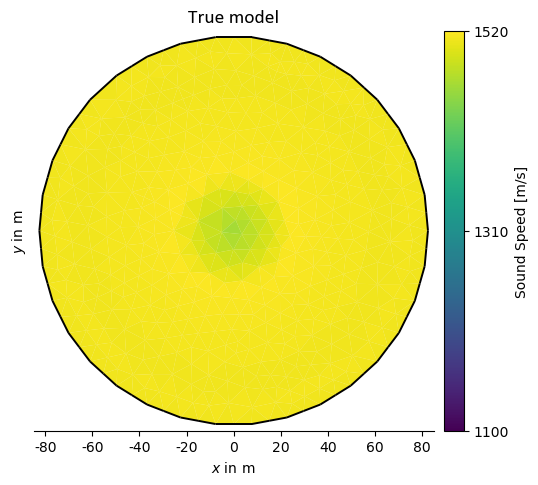

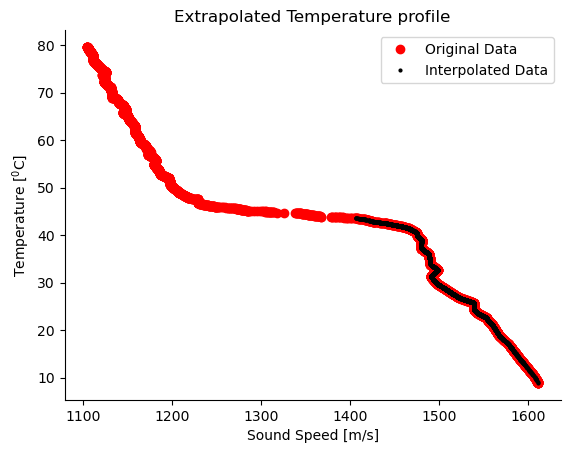

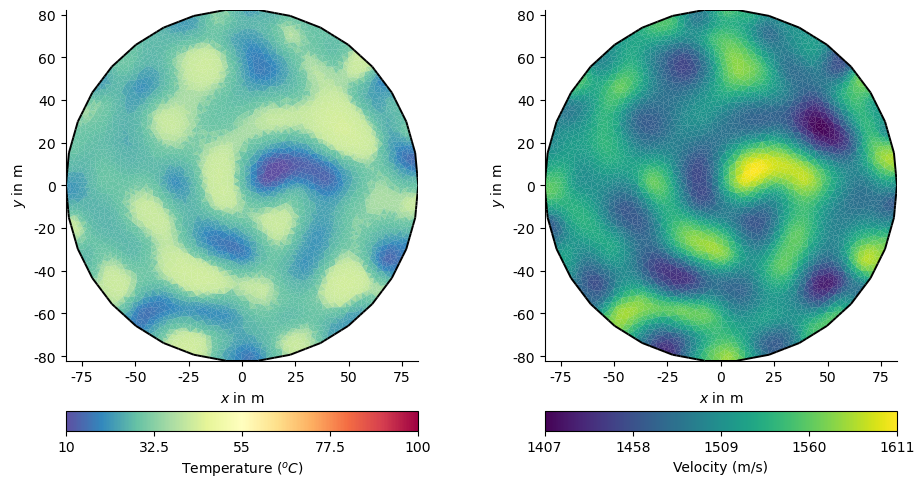

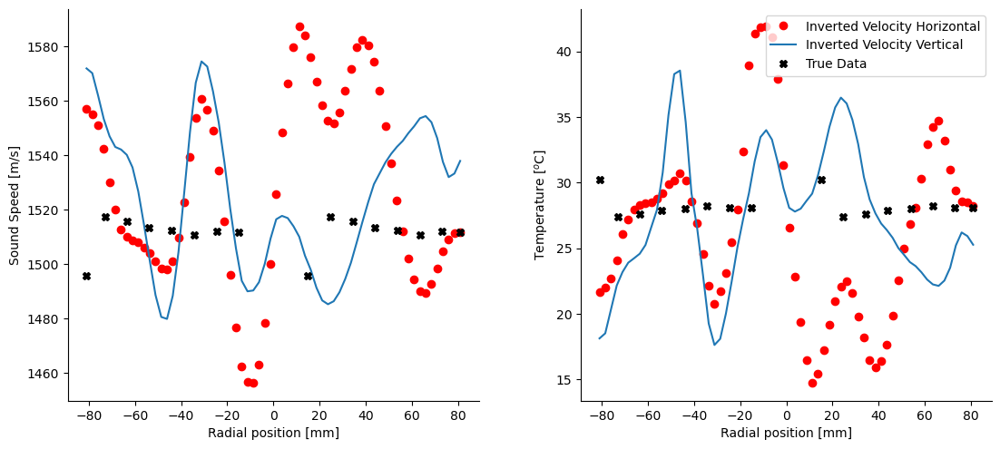

MAE Vertical and Horizontal:  4.76 5.25


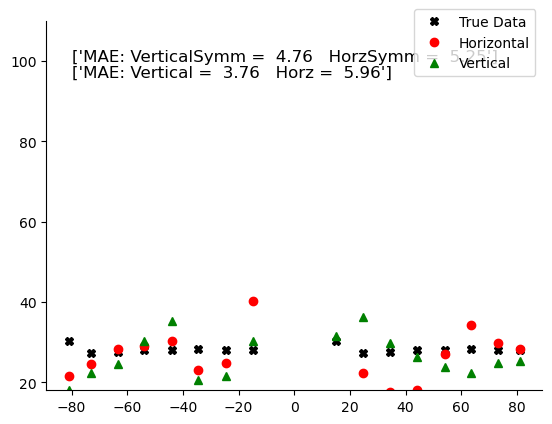

Radial position =  [-15.  -24.5 -34.5 -44.  -54.  -63.5 -73.  -81.   15.   24.5  34.5  44.
  54.   63.5  73.   81. ]
True TC temperature =  [28.11 28.06 28.21 28.   27.91 27.62 27.4  30.23 30.23 27.4  27.62 27.91
 28.   28.21 28.06 28.11]
Horizontal Temperature = [40.11 24.68 22.97 30.25 29.14 28.31 24.52 21.67 16.37 22.23 17.63 18.01
 27.07 34.22 29.76 28.26]
Vertical Temperature = [30.36 21.67 20.54 35.2  30.3  24.6  22.38 18.13 31.47 36.33 29.84 26.29
 23.89 22.25 24.86 25.27]
MAE Vertical and Horizontal:  4.76 5.25
burstIndex =  10 ; burstTime =  10_46_10


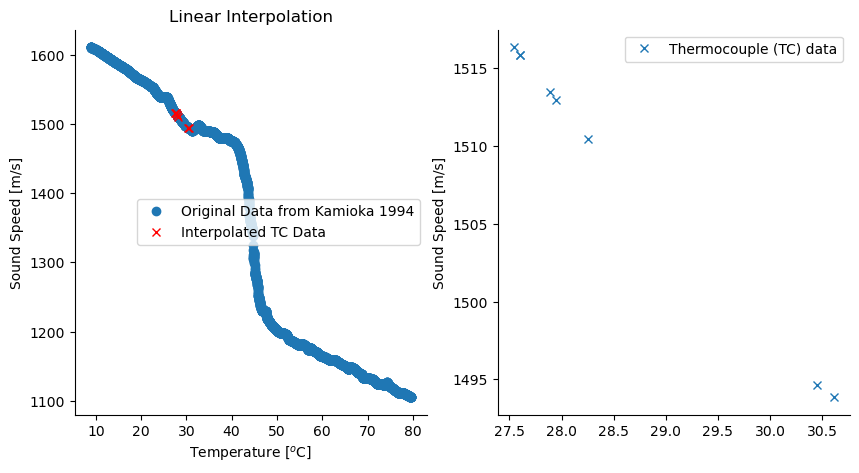

10/02/25 - 10:23:26 - pyGIMLi - INFO - Simulate Traveltime
10/02/25 - 10:23:27 - pyGIMLi - INFO - Creating refined mesh (secnodes: 4) to solve forward task.
10/02/25 - 10:23:33 - pyGIMLi - INFO - Found 1 regions.
10/02/25 - 10:23:33 - pyGIMLi - INFO - Creating forward mesh from region infos.
10/02/25 - 10:23:33 - pyGIMLi - INFO - Creating refined mesh (secnodes: 3) to solve forward task.
10/02/25 - 10:23:34 - pyGIMLi - INFO - Create constant starting model: 0.0006684829181981627
10/02/25 - 10:23:34 - pyGIMLi - INFO - Created startmodel from forward operator:6948, min/max=0.000668/0.000668
10/02/25 - 10:23:34 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.traveltime.modelling.FatrayDijkstraModellingInterpolate object at 0x000001B408E7F2C0>
Data transformation: Identity transform
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 9.3e-06/1.2e-04
min/max (error): 3.59%/4.62%
min/max (start model): 6.7e-04/6.7e-04
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =    1.00
--------------------------------------------------------------------------------
chi² =    0.89 (dPhi = 9.95%) lam: 1500.0


################################################################################
#                  Abort criterion reached: chi² <= 1 (0.89)                   #
################################################################################


C:\Users\376189\Anaconda3\envs\pg\lib\site-packages\pygimli\viewer\mpl\utils.py:165: UserWarning: The figure layout has changed to tight
  ax.figure.tight_layout()



MAE Vertical and Horizontal:  4.1 18.02


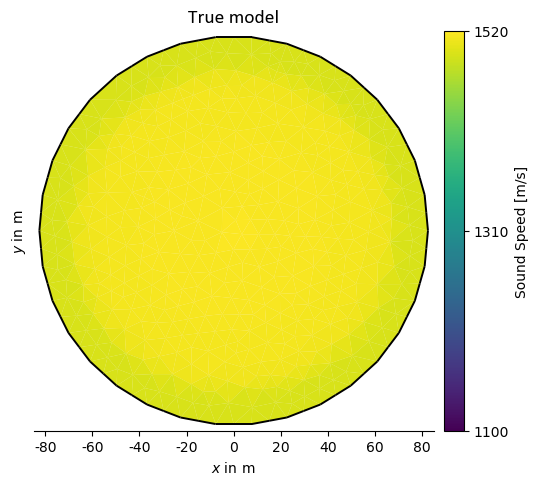

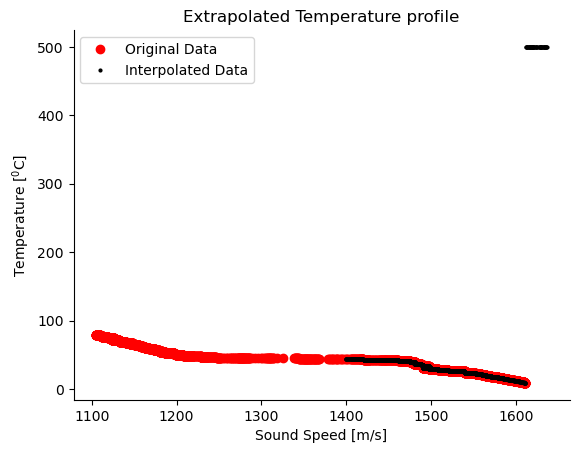

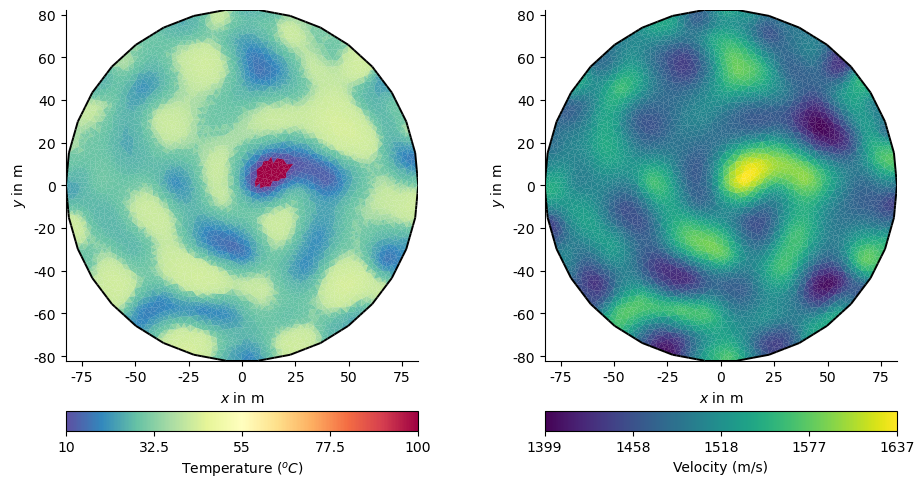

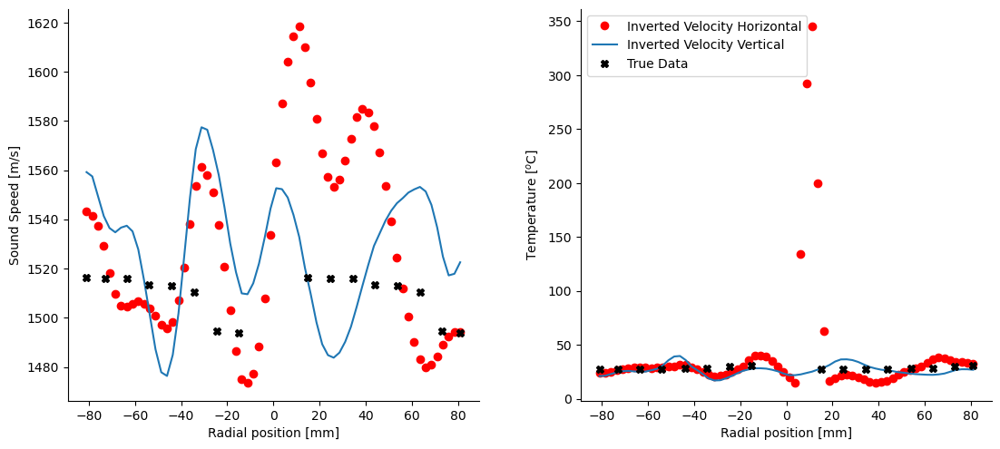

MAE Vertical and Horizontal:  4.77 10.86


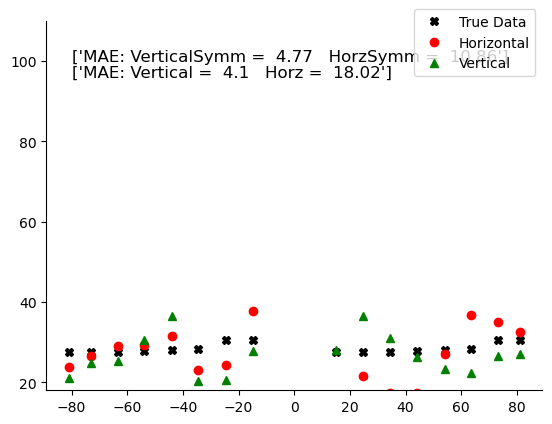

Radial position =  [-15.  -24.5 -34.5 -44.  -54.  -63.5 -73.  -81.   15.   24.5  34.5  44.
  54.   63.5  73.   81. ]
True TC temperature =  [30.61 30.45 28.25 27.95 27.89 27.6  27.6  27.54 27.54 27.6  27.6  27.89
 27.95 28.25 30.45 30.61]
Horizontal Temperature = [ 37.81  24.17  23.05  31.48  29.18  28.96  26.62  23.87 129.07  21.57
  17.35  17.28  27.01  36.75  34.95  32.43]
Vertical Temperature = [27.82 20.5  20.24 36.52 30.43 25.19 24.8  21.07 28.06 36.59 31.06 26.3
 23.38 22.27 26.42 26.97]
MAE Vertical and Horizontal:  4.77 10.86
burstIndex =  11 ; burstTime =  10_46_38


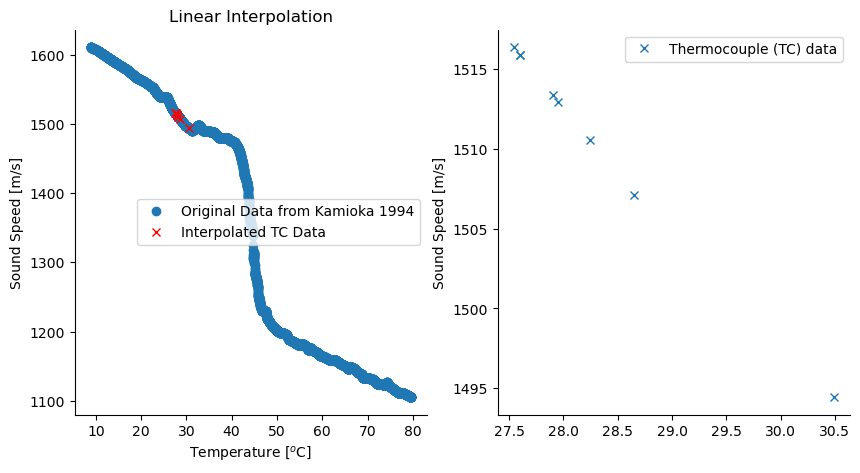

10/02/25 - 10:25:18 - pyGIMLi - INFO - Simulate Traveltime
10/02/25 - 10:25:20 - pyGIMLi - INFO - Creating refined mesh (secnodes: 4) to solve forward task.
10/02/25 - 10:25:26 - pyGIMLi - INFO - Found 1 regions.
10/02/25 - 10:25:26 - pyGIMLi - INFO - Creating forward mesh from region infos.
10/02/25 - 10:25:27 - pyGIMLi - INFO - Creating refined mesh (secnodes: 3) to solve forward task.
10/02/25 - 10:25:27 - pyGIMLi - INFO - Create constant starting model: 0.0006666012295802484
10/02/25 - 10:25:27 - pyGIMLi - INFO - Created startmodel from forward operator:6948, min/max=0.000667/0.000667
10/02/25 - 10:25:27 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.traveltime.modelling.FatrayDijkstraModellingInterpolate object at 0x000001B4A26B6CC0>
Data transformation: Identity transform
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 9.2e-06/1.2e-04
min/max (error): 3.59%/4.62%
min/max (start model): 6.7e-04/6.7e-04
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =    1.00
--------------------------------------------------------------------------------
chi² =    0.90 (dPhi = 9.56%) lam: 1500.0


################################################################################
#                  Abort criterion reached: chi² <= 1 (0.90)                   #
################################################################################


C:\Users\376189\Anaconda3\envs\pg\lib\site-packages\pygimli\viewer\mpl\utils.py:165: UserWarning: The figure layout has changed to tight
  ax.figure.tight_layout()



MAE Vertical and Horizontal:  3.78 16.6


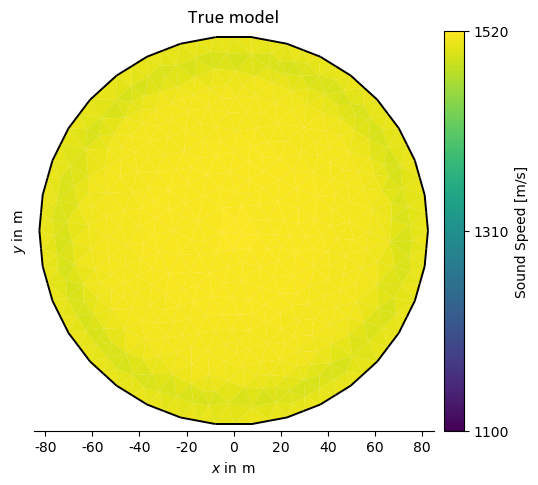

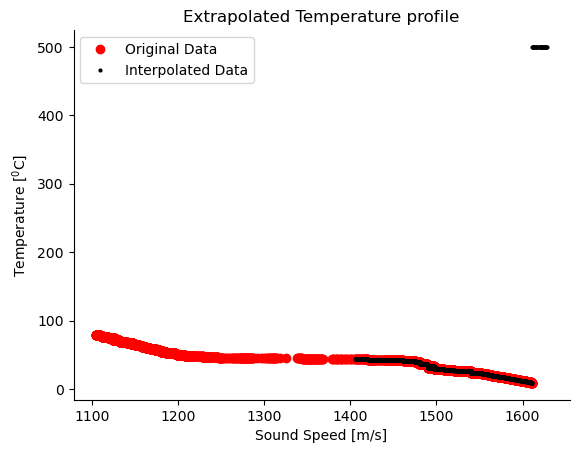

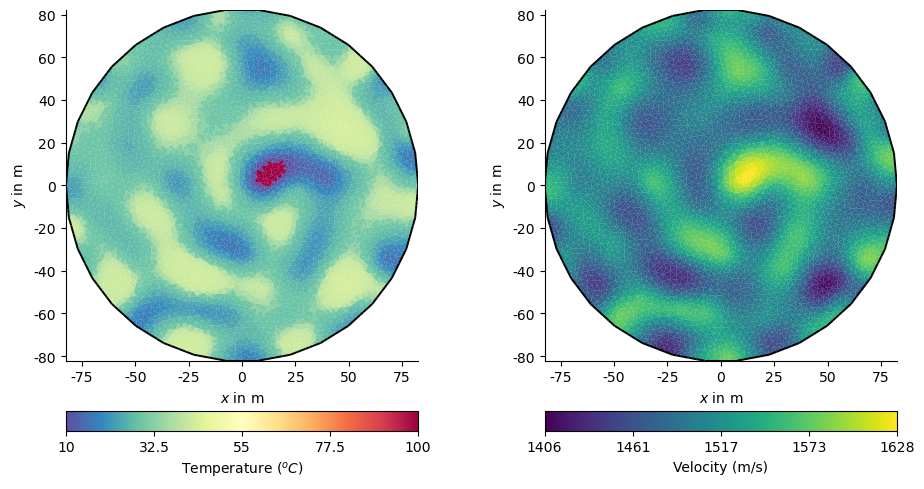

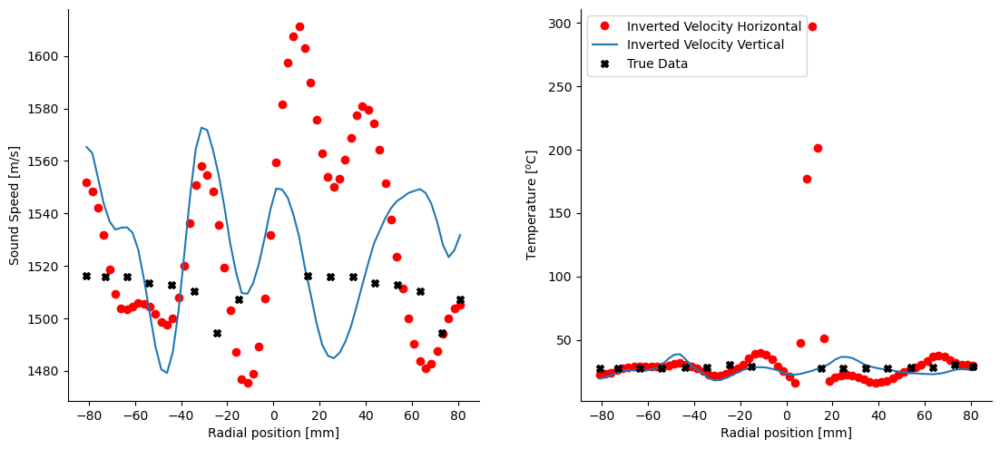

MAE Vertical and Horizontal:  4.4 10.24


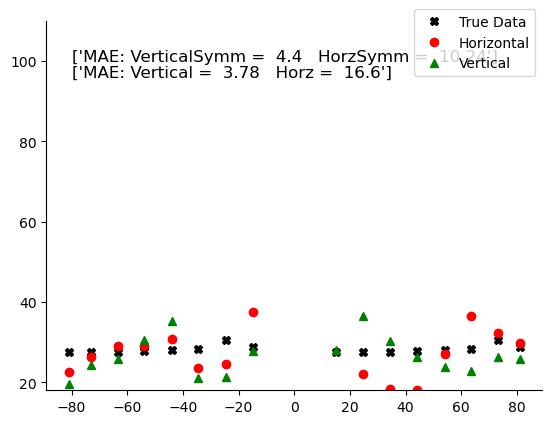

Radial position =  [-15.  -24.5 -34.5 -44.  -54.  -63.5 -73.  -81.   15.   24.5  34.5  44.
  54.   63.5  73.   81. ]
True TC temperature =  [28.65 30.49 28.24 27.95 27.9  27.6  27.6  27.54 27.54 27.6  27.6  27.9
 27.95 28.24 30.49 28.65]
Horizontal Temperature = [ 37.37  24.59  23.64  30.79  29.1   29.11  26.27  22.63 123.36  22.13
  18.24  17.99  27.08  36.56  32.33  29.84]
Vertical Temperature = [27.89 21.24 20.99 35.19 30.44 25.76 24.24 19.64 28.13 36.44 30.17 26.35
 23.68 22.88 26.25 25.86]
MAE Vertical and Horizontal:  4.4 10.24
burstIndex =  12 ; burstTime =  10_47_06


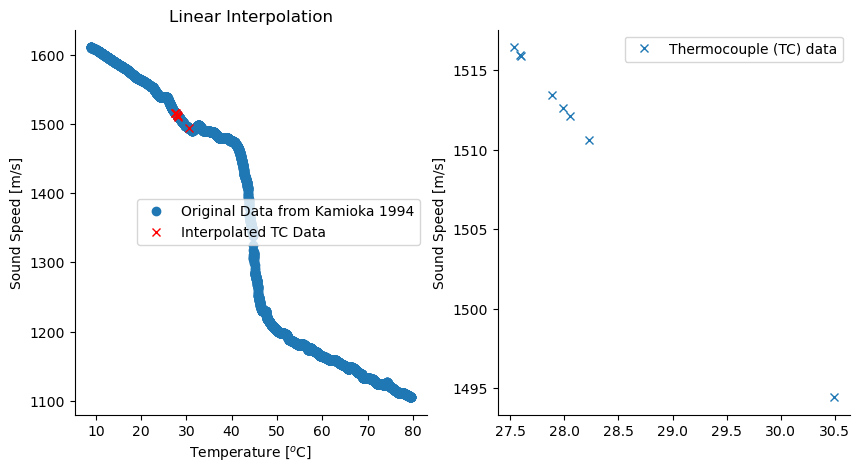

10/02/25 - 10:27:58 - pyGIMLi - INFO - Simulate Traveltime
10/02/25 - 10:28:00 - pyGIMLi - INFO - Creating refined mesh (secnodes: 4) to solve forward task.
10/02/25 - 10:28:07 - pyGIMLi - INFO - Found 1 regions.
10/02/25 - 10:28:07 - pyGIMLi - INFO - Creating forward mesh from region infos.
10/02/25 - 10:28:07 - pyGIMLi - INFO - Creating refined mesh (secnodes: 3) to solve forward task.
10/02/25 - 10:28:07 - pyGIMLi - INFO - Create constant starting model: 0.0006647732881024989
10/02/25 - 10:28:07 - pyGIMLi - INFO - Created startmodel from forward operator:6948, min/max=0.000665/0.000665
10/02/25 - 10:28:07 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.traveltime.modelling.FatrayDijkstraModellingInterpolate object at 0x000001B43AB4C540>
Data transformation: Identity transform
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 9.2e-06/1.2e-04
min/max (error): 3.59%/4.62%
min/max (start model): 6.6e-04/6.6e-04
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =    1.00
--------------------------------------------------------------------------------
chi² =    0.90 (dPhi = 9.75%) lam: 1500.0


################################################################################
#                  Abort criterion reached: chi² <= 1 (0.90)                   #
################################################################################


C:\Users\376189\Anaconda3\envs\pg\lib\site-packages\pygimli\viewer\mpl\utils.py:165: UserWarning: The figure layout has changed to tight
  ax.figure.tight_layout()



MAE Vertical and Horizontal:  3.68 16.57


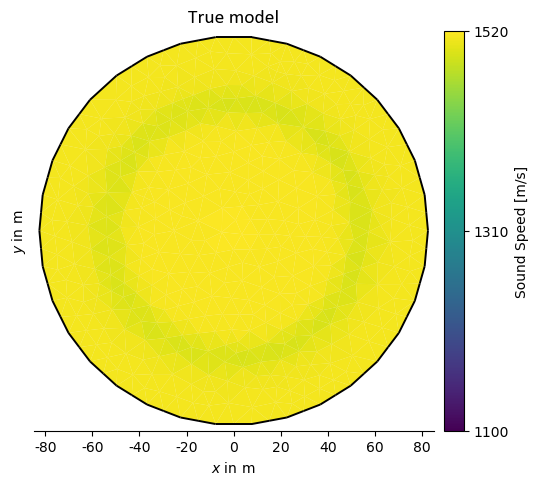

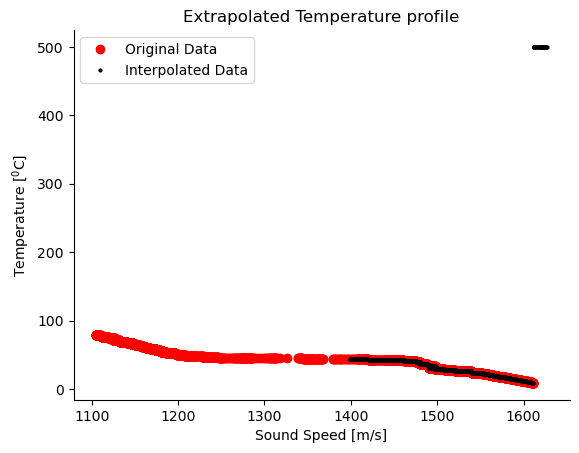

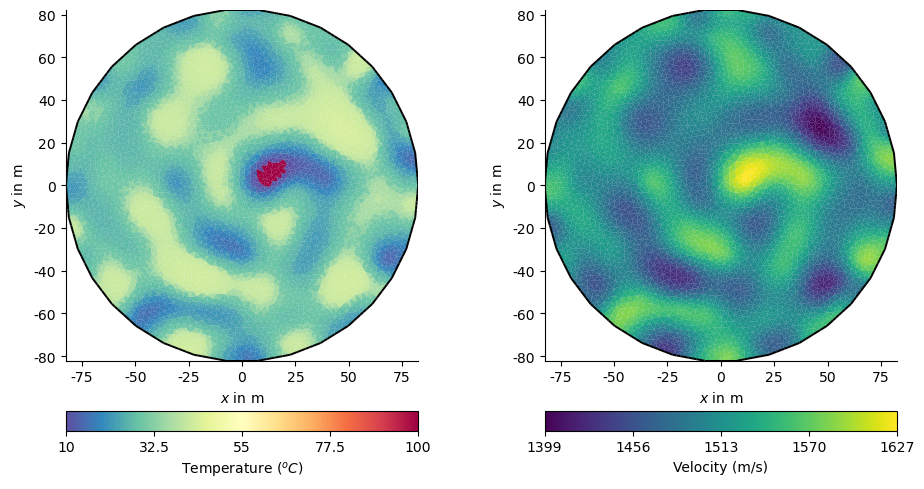

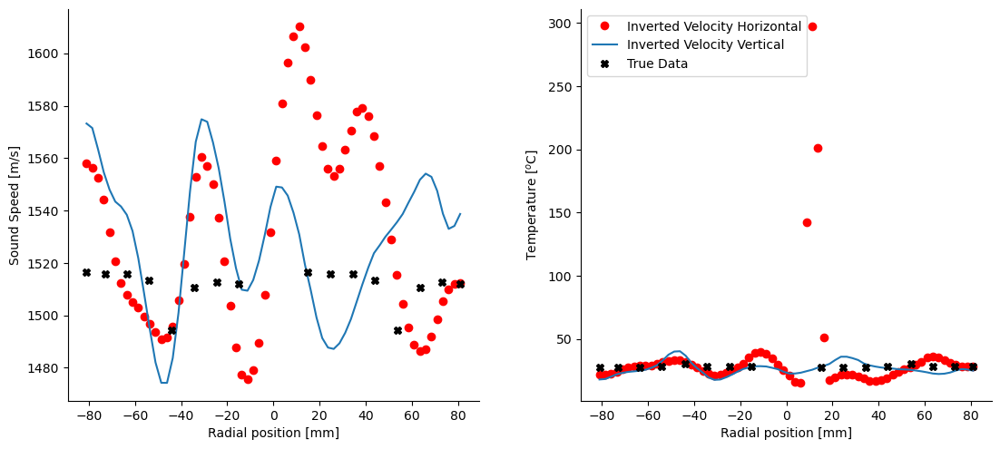

MAE Vertical and Horizontal:  4.58 10.37


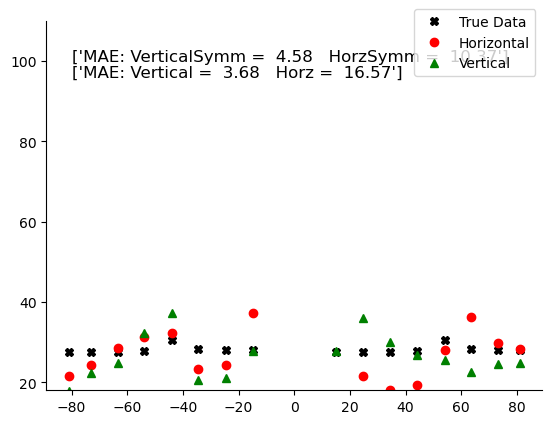

Radial position =  [-15.  -24.5 -34.5 -44.  -54.  -63.5 -73.  -81.   15.   24.5  34.5  44.
  54.   63.5  73.   81. ]
True TC temperature =  [28.05 27.99 28.23 30.49 27.89 27.59 27.6  27.53 27.53 27.6  27.59 27.89
 30.49 28.23 27.99 28.05]
Horizontal Temperature = [ 37.26  24.25  23.24  32.2   31.29  28.56  24.3   21.45 123.41  21.65
  17.99  19.28  27.97  36.2   29.79  28.28]
Vertical Temperature = [27.85 20.94 20.66 37.18 32.32 24.8  22.19 17.86 27.9  35.87 29.99 26.77
 25.48 22.58 24.61 24.83]
MAE Vertical and Horizontal:  4.58 10.37
burstIndex =  13 ; burstTime =  10_47_34


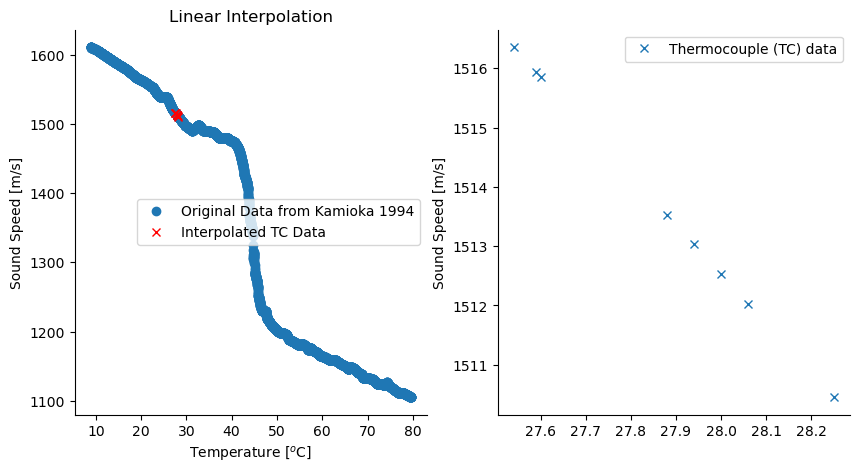

10/02/25 - 10:30:48 - pyGIMLi - INFO - Simulate Traveltime
10/02/25 - 10:30:49 - pyGIMLi - INFO - Creating refined mesh (secnodes: 4) to solve forward task.
10/02/25 - 10:30:56 - pyGIMLi - INFO - Found 1 regions.
10/02/25 - 10:30:56 - pyGIMLi - INFO - Creating forward mesh from region infos.
10/02/25 - 10:30:56 - pyGIMLi - INFO - Creating refined mesh (secnodes: 3) to solve forward task.
10/02/25 - 10:30:56 - pyGIMLi - INFO - Create constant starting model: 0.0006641442863629311
10/02/25 - 10:30:56 - pyGIMLi - INFO - Created startmodel from forward operator:6948, min/max=0.000664/0.000664
10/02/25 - 10:30:56 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.traveltime.modelling.FatrayDijkstraModellingInterpolate object at 0x000001B41ACC9680>
Data transformation: Identity transform
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 9.2e-06/1.2e-04
min/max (error): 3.59%/4.62%
min/max (start model): 6.6e-04/6.6e-04
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =    1.00
--------------------------------------------------------------------------------
chi² =    0.90 (dPhi = 9.57%) lam: 1500.0


################################################################################
#                  Abort criterion reached: chi² <= 1 (0.90)                   #
################################################################################


C:\Users\376189\Anaconda3\envs\pg\lib\site-packages\pygimli\viewer\mpl\utils.py:165: UserWarning: The figure layout has changed to tight
  ax.figure.tight_layout()



MAE Vertical and Horizontal:  3.65 16.24


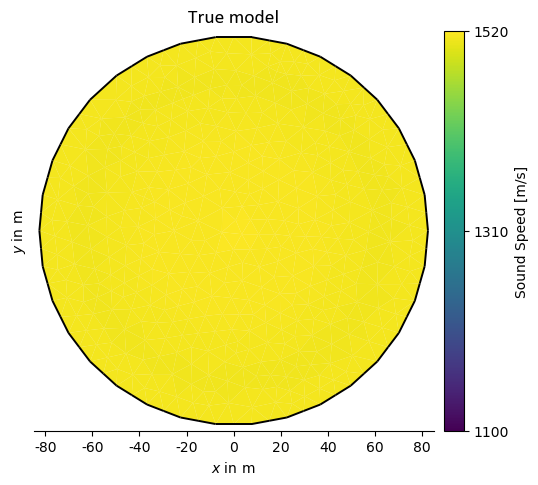

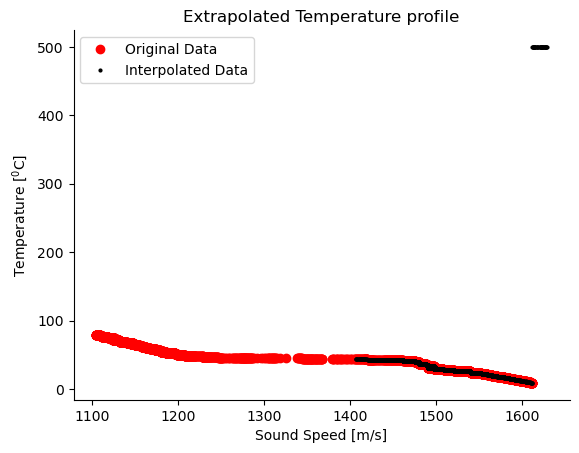

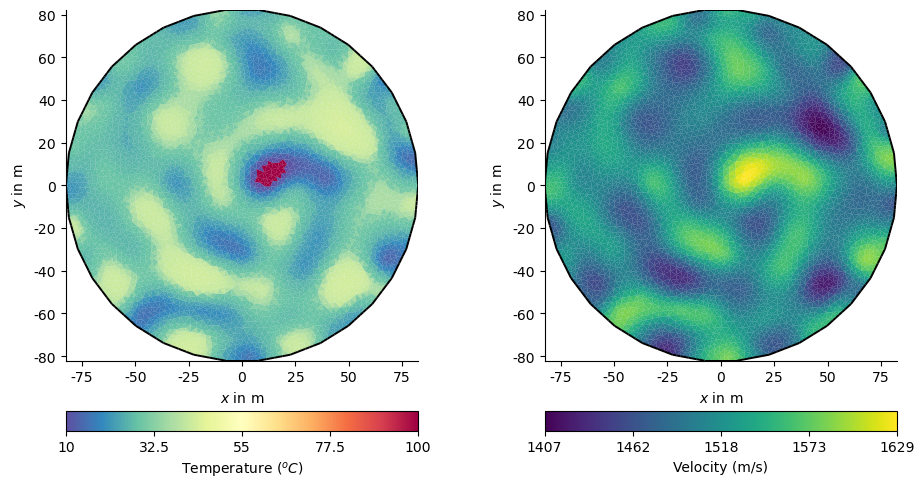

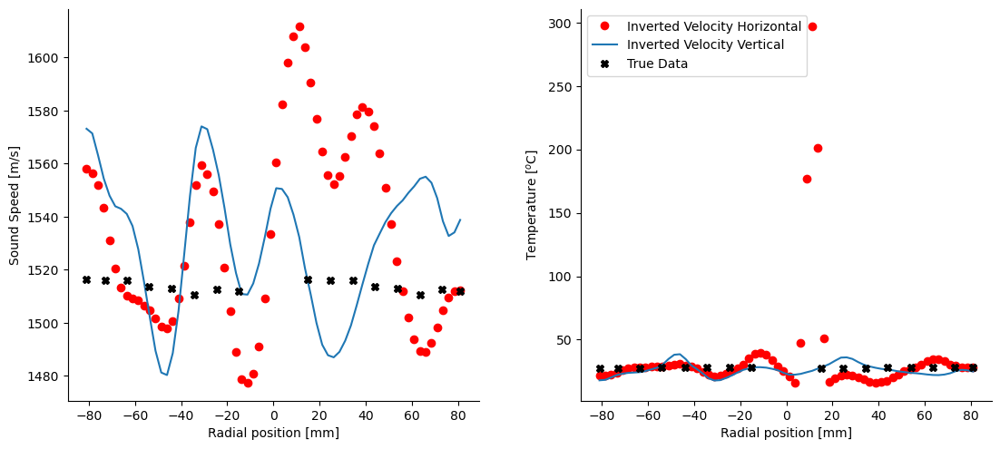

MAE Vertical and Horizontal:  4.47 10.04


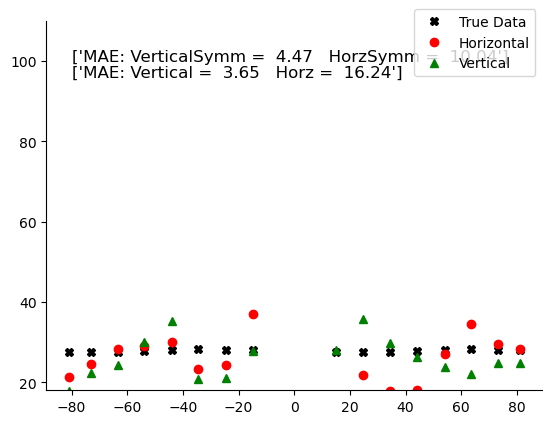

Radial position =  [-15.  -24.5 -34.5 -44.  -54.  -63.5 -73.  -81.   15.   24.5  34.5  44.
  54.   63.5  73.   81. ]
True TC temperature =  [28.06 28.   28.25 27.94 27.88 27.59 27.6  27.54 27.54 27.6  27.59 27.88
 27.94 28.25 28.   28.06]
Horizontal Temperature = [ 36.88  24.3   23.26  29.97  29.08  28.27  24.43  21.42 123.21  21.77
  17.92  18.04  27.08  34.43  29.6   28.28]
Vertical Temperature = [27.75 21.04 20.69 35.2  29.92 24.33 22.22 17.88 27.99 35.86 29.69 26.3
 23.76 22.1  24.8  24.82]
MAE Vertical and Horizontal:  4.47 10.04
burstIndex =  14 ; burstTime =  10_48_02


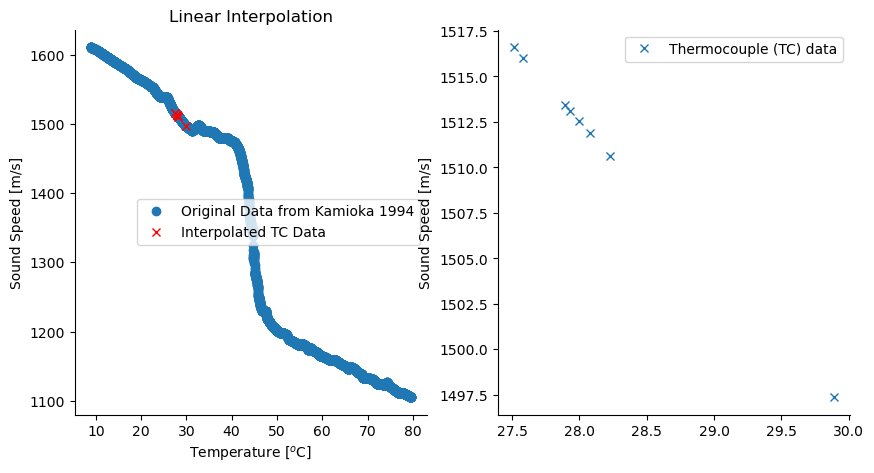

10/02/25 - 10:33:37 - pyGIMLi - INFO - Simulate Traveltime
10/02/25 - 10:33:38 - pyGIMLi - INFO - Creating refined mesh (secnodes: 4) to solve forward task.
10/02/25 - 10:33:46 - pyGIMLi - INFO - Found 1 regions.
10/02/25 - 10:33:46 - pyGIMLi - INFO - Creating forward mesh from region infos.
10/02/25 - 10:33:46 - pyGIMLi - INFO - Creating refined mesh (secnodes: 3) to solve forward task.
10/02/25 - 10:33:46 - pyGIMLi - INFO - Create constant starting model: 0.0006644480304409013
10/02/25 - 10:33:46 - pyGIMLi - INFO - Created startmodel from forward operator:6948, min/max=0.000664/0.000664
10/02/25 - 10:33:46 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.traveltime.modelling.FatrayDijkstraModellingInterpolate object at 0x000001B453BCE900>
Data transformation: Identity transform
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 9.2e-06/1.2e-04
min/max (error): 3.59%/4.62%
min/max (start model): 6.6e-04/6.6e-04
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =    1.00
--------------------------------------------------------------------------------
chi² =    0.90 (dPhi = 9.63%) lam: 1500.0


################################################################################
#                  Abort criterion reached: chi² <= 1 (0.90)                   #
################################################################################


C:\Users\376189\Anaconda3\envs\pg\lib\site-packages\pygimli\viewer\mpl\utils.py:165: UserWarning: The figure layout has changed to tight
  ax.figure.tight_layout()



MAE Vertical and Horizontal:  3.71 14.26


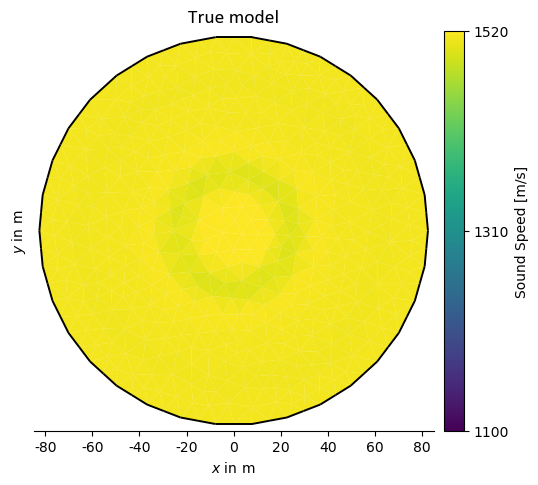

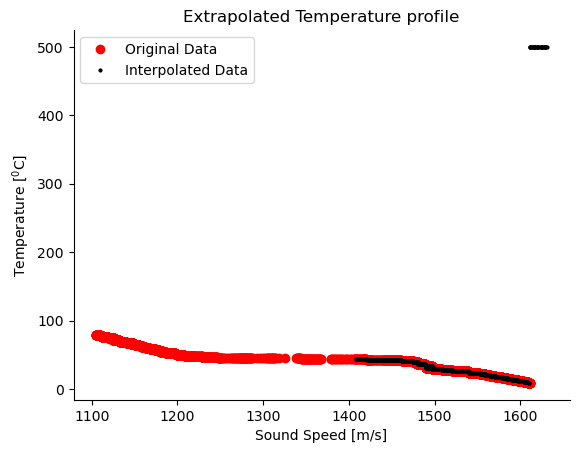

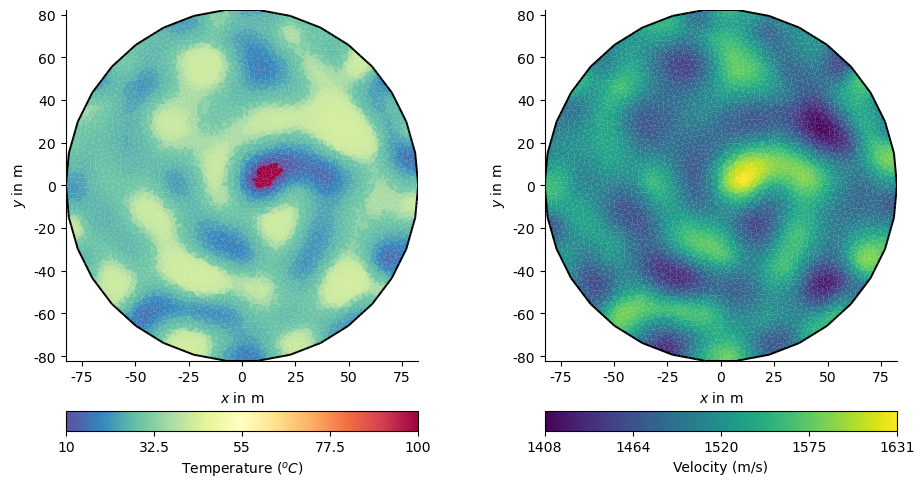

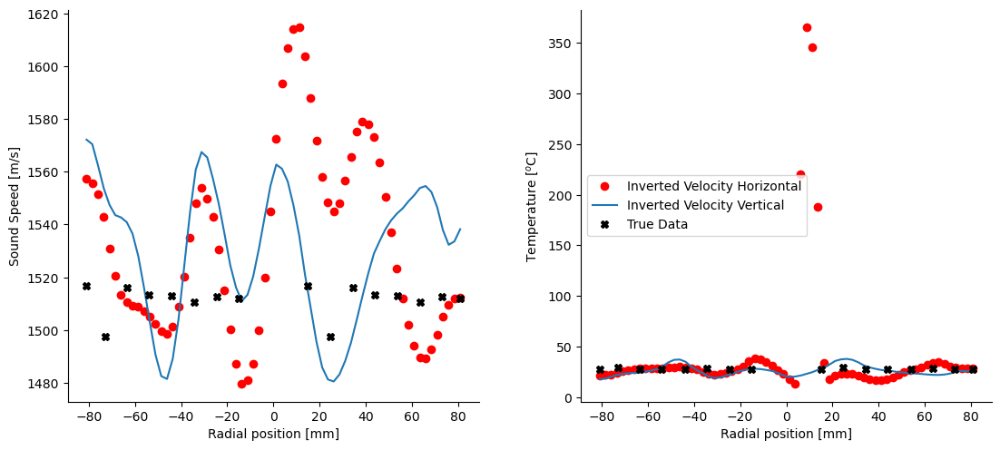

MAE Vertical and Horizontal:  4.48 9.05


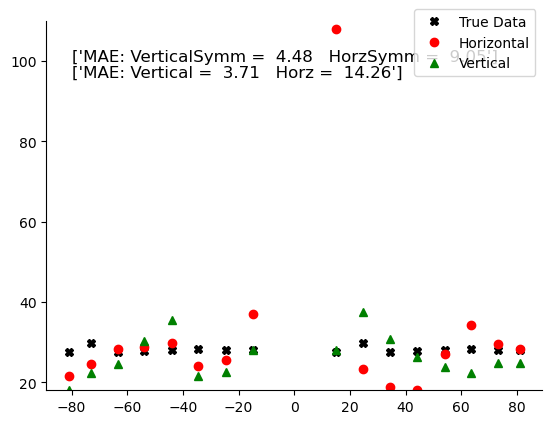

Radial position =  [-15.  -24.5 -34.5 -44.  -54.  -63.5 -73.  -81.   15.   24.5  34.5  44.
  54.   63.5  73.   81. ]
True TC temperature =  [28.08 28.   28.23 27.93 27.89 27.58 29.89 27.51 27.51 29.89 27.58 27.89
 27.93 28.23 28.   28.08]
Horizontal Temperature = [ 37.02  25.45  23.97  29.81  28.86  28.26  24.46  21.57 107.9   23.23
  18.88  18.19  27.07  34.28  29.51  28.3 ]
Vertical Temperature = [27.91 22.59 21.64 35.37 30.2  24.52 22.32 18.07 28.09 37.61 30.82 26.32
 23.75 22.2  24.84 24.87]
MAE Vertical and Horizontal:  4.48 9.05
burstIndex =  15 ; burstTime =  10_48_30


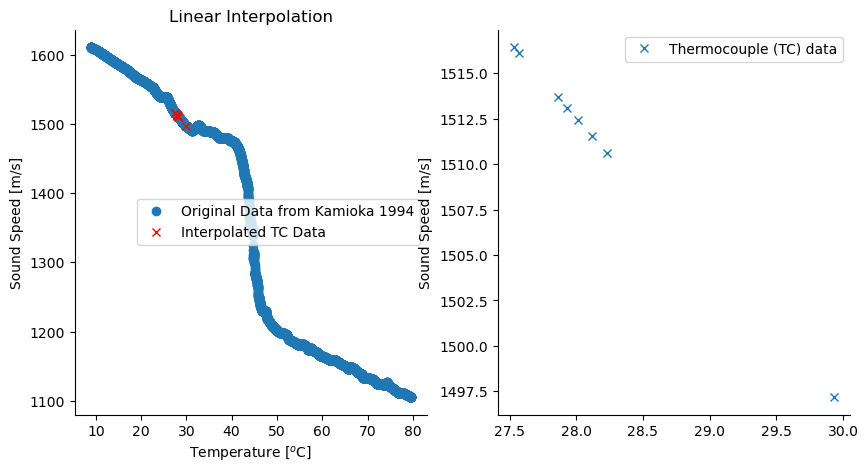

10/02/25 - 10:36:36 - pyGIMLi - INFO - Simulate Traveltime
10/02/25 - 10:36:37 - pyGIMLi - INFO - Creating refined mesh (secnodes: 4) to solve forward task.
10/02/25 - 10:36:44 - pyGIMLi - INFO - Found 1 regions.
10/02/25 - 10:36:44 - pyGIMLi - INFO - Creating forward mesh from region infos.
10/02/25 - 10:36:44 - pyGIMLi - INFO - Creating refined mesh (secnodes: 3) to solve forward task.
10/02/25 - 10:36:45 - pyGIMLi - INFO - Create constant starting model: 0.0006644490907208251
10/02/25 - 10:36:45 - pyGIMLi - INFO - Created startmodel from forward operator:6948, min/max=0.000664/0.000664


In [ ]:
resultTrueTemp = np.zeros((16,len(TCtemp_exp_all)))
resultHorzTemp = np.zeros((16,len(TCtemp_exp_all)))
resultVertTemp = np.zeros((16,len(TCtemp_exp_all)))
maeVert = np.zeros((1,len(TCtemp_exp_all)))
maeHorz = np.zeros((1,len(TCtemp_exp_all)))

date = datetime.datetime.now().strftime("%d%b%Y")

count = 0
for burstIndex in range(1,len(TCtemp_exp_all)):
    count = count +1
    burstTime = TCtemp_exp_all[burstIndex,0].replace(':', '_')
    print('burstIndex = ', burstIndex,'; burstTime = ', burstTime)
    
    
    temp_from_TC = TCtemp_exp_all[burstIndex,2:] 
    temp_from_TC = temp_from_TC[::-1].astype(float)  

    # plt.plot(temp_from_TC,'ob')
    
    # Existing data (x and y arrays)
    ref_temp = temp_profiles_Kamioka # Temperature from Kamioka Paper
    ref_speed = spd_profiles_Kamioka  # Sound Speed from Kamioka Paper
    
    # Perform linear interpolation
    f = interp1d(ref_temp, ref_speed, kind='linear', fill_value="extrapolate")
    
    # New set of x values
    exp_temp = temp_from_TC #temp_12_10  # temperaature from TC obtained experimentally
    exp_vel_interp = f(exp_temp)    # Velocity Interpolated from temperature, using Kamioka paper.
    
    # Plotting
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    ax1.plot(ref_temp, ref_speed, 'o', label='Original Data from Kamioka 1994')
    ax1.plot(exp_temp, exp_vel_interp, 'xr',label='Interpolated TC Data')
    ax1.legend()
    ax1.set_xlabel('Temperature [$^o$C]')
    ax1.set_ylabel('Sound Speed [m/s]')
    ax1.set_title('Linear Interpolation')
    
    ax2.plot(exp_temp, exp_vel_interp, 'x', label='Thermocouple (TC) data')
    # ax2.set_xlabel('Temperature [$^0$C]')
    ax2.set_ylabel('Sound Speed [m/s]')
    ax2.legend()
    plt.show()

    #----------------------------------------------------------------------------------#
    #----------------------------------------------------------------------------------#
    TcPos = np.array([15.0, 24.5, 34.5, 44.0, 54.0, 63.5, 73.0, 81.0])*1e-3
    radialPos = np.array([15.0, 24.5, 34.5, 44.0, 54.0, 63.5, 73.0, 81.0])*1e-3
    
    temperature = exp_temp
    sound_speed = exp_vel_interp
    
    #----------------------------------------------------------------------------------#
    # %%%%%%%%%%%%%%%%%%%%%%%%% Create a forward model %%%%%%%%%%%%%%%%%%%%%%%%% 
    #----------------------------------------------------------------------------------#
    rad = 165.06/2*1e-3 #max(radialPos)
    numberSources = 34
    
    c1 = mt.createCircle(radius=rad, pos=[0.0, 0.0], nSegments=numberSources,area=0.0025, marker=1)
    poly = mt.mergePLC([c1])
    poly.addRegionMarker([0.0, 0, 0], 1, area=0.0015)
    
    c = mt.createCircle(radius=rad, nSegments=numberSources, start=np.pi, end=np.pi*3)
    [poly.createNode(p.pos(), -99) for p in c.nodes()] # nodes for positionong sensors
    
    # Model mesh for forward modeling
    mesh_fwd = pg.meshtools.createMesh(poly, quality=32.0, area=0.04e-3, smooth=[1, 10]) # area=0.011e-3

    #----------------------------------------------------------------------------------#
    # ### Create velocity model for a range of varying velocity and Assign source receiver positions 
    #----------------------------------------------------------------------------------#

    my_velocity = sound_speed
    my_radius = radialPos #np.linspace(0,0.07018,len(exp_temp))
    
    cc = mesh_fwd.cellCenters()
    r = np.sqrt(pg.x(cc)**2 + pg.y(cc)**2)
    f = interp1d(my_radius, my_velocity, fill_value="extrapolate")
    vel = f(r)
    
    # ax2.set(xlim =(-0.085, 0.085),  
    #         ylim =(-0.085, 0.085), 
    #         autoscale_on = False) 
    
    # scale_x=1e-3
    # ticks_x = ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_x))
    # ax2.xaxis.set_major_formatter(ticks_x)
    # ax2.yaxis.set_major_formatter(ticks_x)
    
    #----------------------------------------------------------------------------------#
    # ### Forward Model: Simulate traveltime measurement
    #----------------------------------------------------------------------------------#
    sensors = mesh_fwd.positions()[mesh_fwd.findNodesIdxByMarker(-99)]
    pg.info("Simulate Traveltime")
    
    ttScheme = tt.createRAData(sensors)    
    plt.rc('axes.spines', **{'bottom':True, 'left':True, 'right':False, 'top':False})
    ax, _ = pg.show(mesh_fwd, vel, cMin=1100, cMax=1520,
                    # cMap="RdGy_r",
                    orientation="vertical",
                    label="Sound Speed [m/s]", 
                    nLevs=3)
    ax.set_title("True model", fontsize=14, fontname="Calibri")
    ax.spines['left'].set_visible(False)
    ax.set_yticks([])
    ax.set_xlim([-85e-3,85e-3])
    ax.set_ylim([-85e-3,85e-3])
    
    scale_x=1e-3
    ticks_x = ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_x))
    ax.xaxis.set_major_formatter(ticks_x)
    ax.yaxis.set_major_formatter(ticks_x)

    # figNameTrue = ''+ str(burstTime) +'.png'
    # figNameFwd = 'data/wax_sgt_01_27_2025/fatRay_figures_solid_error_7/forward/Wax_fatRay_fwdModel_BurstTime_'+ str(burstTime) + '_' + date  +'.png'
    # plt.savefig(figNameFwd, bbox_inches='tight')
    # plt.show()
    
    source = ttScheme["s"]
    receiver = ttScheme["g"]

    #----------------------------------------------------------------------------------#
    # ### Forward Simualtion
    #----------------------------------------------------------------------------------#

    mgr =  tt.TravelTimeManager()
    # save the data,, whcih will provide us the data container
    ttData = mgr.simulate(mesh_fwd,
                          scheme=ttScheme, 
                          slowness=1/vel,
                          #vel=vel, 
                          noiseLevel=0.04, 
                          #noiseAbs=0.5e-6,
                          secNodes=4,
                          seed=1337)   # seed for numpy gaussian noise for reproducibiility
    
    #----------------------------------------------------------------------------------#
    # ### Save the data
    #----------------------------------------------------------------------------------#
    
    # filenNameSave = '' + burstTime + '_' + date + '.sgt'  
    filenNameData = 'data/wax_sgt_01_27_2025/fatRay_data_solid_error_4/wax_fatRay_ttdata_busrtTime_' + burstTime + '_' + date + '.sgt'
    ttData.save(filenNameData)

    #----------------------------------------------------------------------------------#
    # ### Inversion
    #----------------------------------------------------------------------------------#
    data = tt.load(filenNameData)

    #----------------------------------------------------------------------------------#
    # ### Create mesh for inversion
    #----------------------------------------------------------------------------------#
    # pseudo mesh for inverison
    pMesh =pg.meshtools.createMesh(poly, quality=32.0, area=0.005e-3, smooth=[1, 10]) # area=0.011e-3
    
    #----------------------------------------------------------------------------------#
    # ### Fat-ray tomogrpahy
    #----------------------------------------------------------------------------------#
    frequency = 320e3
    mgr = tt.TravelTimeManager(data=data, fatray=True, secNodes=4, frequency=frequency, verbose=True)
    velInv = mgr.invert(data, 
                        mesh=pMesh,
                        lam=1500, 
                        # startModel=1/1000,      # use in defaul
                        useGradient=False,      # use in defaul 'false' 
                        secNodes=3,
                        # showProgress= False, 
                        # verbose=False,
                        # zWeight=12, 
                        # absoluteError=1e-3,
                        blockyModel = True,
                        robustData = True,
                        # lambdaFactor=1,
                        cType=2,
                        # isReference=False, 
                       )
    
    # mgr.showResult(cMap="Spectral_r",nLevs=3, logScale=False,showMesh=False)
    #----------------------------------------------------------------------------------#
    # ### Convert velocity map to temperature map:  Interpolate data
    #----------------------------------------------------------------------------------#
    pgmesh = mgr.paraDomain
    pgmesh["velocity"] = mgr.velocity
    pvmesh = pg.viewer.pv.pgMesh2pvMesh(pgmesh)
    centers = mgr.paraDomain.cellCenters()
    pgmesh["velocity"].shape
    
    f_interp = interp1d(ref_speed, ref_temp, fill_value=(1500,500), kind='previous', bounds_error=False) 
    
    # f_interp = interp1d(ref_speed, ref_temp, 
    #                     fill_value=(temp_profilesAtBurst[0],temp_profilesAtBurst[-1]),
    #                     #fill_value=(10, 200),
    #                     #fill_value='extrapolate',
    #                     kind='cubic',
    #                     bounds_error=False,
    #                     axis=0)     #1D value out of bounds
    
    vel2interp = pgmesh["velocity"]          # interprolating the velocity
    tempInterp = f_interp(vel2interp)
    #print(tempInterp)
    
    fig, ax1 = plt.subplots();
    line1 = ax1.plot(ref_speed,ref_temp,'or', markersize=6);
    line2 = ax1.plot(vel2interp,tempInterp,'.k', markersize=4);
    ax1.set_xlabel('Sound Speed [m/s]');
    ax1.set_ylabel('Temperature [$^0$C]');
    ax1.set_title('Extrapolated Temperature profile');
    lines = line1 + line2
    ax1.legend(lines, ['Original Data','Interpolated Data']);

    #----------------------------------------------------------------------------------#
    # ### Plotting
    #----------------------------------------------------------------------------------#

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    pg.show(pMesh,tempInterp,showMesh=False,
            cMin=10, cMax=100,
            label = r'Temperature (${^o C}$)',
            # cMap="plasma_r",
            cMap=pg.cmap('res'),
            ax=ax1) 
    pg.show(pMesh,pgmesh["velocity"],showMesh=False,
            # cMin=1502, cMax=1520,
            label=pg.unit('vel'),
            cMap=pg.cmap('vel'),
            # cMap=pg.cmap('res'),
            ax=ax2) 
    scale_x=1e-3
    ticks_x = ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_x))
    ax1.xaxis.set_major_formatter(ticks_x)
    ax1.yaxis.set_major_formatter(ticks_x)
    ax2.xaxis.set_major_formatter(ticks_x)
    ax2.yaxis.set_major_formatter(ticks_x)
    
    # figNameInv = ''+ str(burstTime) +'.png'
    # figNameInv = 'data/wax_sgt_01_27_2025/fatRay_figures_solid_error_7/inverse/Wax_fatRay_InvModel_BurstTime_'+ str(burstTime) + '_' + date  +'.png'
    # plt.savefig(figNameInv, bbox_inches='tight')
    # plt.show()

    #----------------------------------------------------------------------------------#
    # ### Post processing
    #----------------------------------------------------------------------------------#
    x_start_cord = -0.081 
    x_end_cord = 0.081 
    y_start_cord = 0
    y_end_cord = 0
    number_of_points = 66 # len(r)
    
    # list of probe points for your 1D slice through the center (radial positions)
    pntsHorz = np.linspace((x_start_cord, y_start_cord),(x_end_cord, y_end_cord),number_of_points)
    pntsVert = np.linspace((y_start_cord, x_start_cord),(y_end_cord, x_end_cord),number_of_points)
    
    velLineHorz = pg.interpolate(mgr.paraDomain, mgr.velocity, pntsHorz)
    velLineVert = pg.interpolate(mgr.paraDomain, mgr.velocity, pntsVert)
    
    tempLineHorz = pg.interpolate(mgr.paraDomain, tempInterp, pntsHorz)
    tempLineVert = pg.interpolate(mgr.paraDomain, tempInterp, pntsVert)
    
    ## interpolated values for the radial position
    interp_horz = interp1d(pntsHorz[:,0], tempLineHorz, kind='linear')
    interp_vert = interp1d(pntsVert[:,1], tempLineVert, kind='linear')
    
    # interpolate for given radial position
    temp_new_horz = interp_horz(radialPos)
    temp_new_vert = interp_vert(radialPos)
    
    # Mean Absolute Error = (1/n) * ∑|yi – xi|
    print('')
    errorVertMAE = mae(exp_temp, temp_new_vert ) 
    errorHorzMAE = mae(exp_temp, temp_new_horz) 
    print("MAE Vertical and Horizontal: ", np.round(errorVertMAE,2), np.round(errorHorzMAE,2)) 
    
    #----------------------------------------------------------------------------------#   
    # plotting figure
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    fig.tight_layout(pad=5.0)
    ax1.plot(pntsHorz[:,0]*1000,velLineHorz,'or',label='Inverted Velocity Horizontal')
    ax1.plot(pntsVert[:,1]*1000,velLineVert,label='Inverted Velocity Vertical')
    
    # ax1.plot(radialPos*1000, exp_vel_interp, 'Xk', label='True Data')
    arr1 = np.concatenate((-1*radialPos, radialPos))
    arr2 =  np.concatenate((exp_vel_interp[::-1], exp_vel_interp)) 
    ax1.plot(arr1*1000,arr2, 'Xk', label='True Data')
    
    ax1.set_xlabel('Radial position [mm]')
    ax1.set_ylabel('Sound Speed [m/s]')
    # ax1.legend()
    
    ax2.plot(pntsHorz[:,0]*1000, tempLineHorz,'or',label='Inverted Velocity Horizontal')
    ax2.plot(pntsVert[:,1]*1000, tempLineVert, label='Inverted Velocity Vertical')
    
    # ax2.plot(radialPos*1000, exp_temp, 'Xk', label='True Data')
    arr3 =  np.concatenate((exp_temp[::-1], exp_temp)) 
    ax2.plot(arr1*1000,arr3, 'Xk', label='True Data')
    
    ax2.legend()
    ax2.set_xlabel('Radial position [mm]')
    ax2.set_ylabel('Temperature [$^o$C]')
    # ax2.set_ylim([0,50])
    plt.show()
    
    
    ## interpolated values for the radial pos+ition
    interp_horz = interp1d(pntsHorz[:,0], tempLineHorz, kind='linear')
    interp_vert = interp1d(pntsVert[:,1], tempLineVert, kind='linear')
    
    # interpolate for given radial position
    temp_new_horz = interp_horz(arr1)
    temp_new_vert = interp_vert(arr1)
    
    # Mean Absolute Error = (1/n) * ∑|yi – xi|
    errorVertMAE_symm = mae(arr3, temp_new_vert) 
    errorHorzMAE_symm = mae(arr3, temp_new_horz) 
    print("MAE Vertical and Horizontal: ", np.round(errorVertMAE_symm,2), np.round(errorHorzMAE_symm,2)) 
    
    plt.plot(arr1*1000, arr3, 'Xk', label='True Data')
    plt.plot(arr1*1000, temp_new_horz,'or', label='Horizontal')
    plt.plot(arr1*1000, temp_new_vert,'^g', label='Vertical')
    plt.ylim([18,110])
    aa = str('VerticalSymm =  '+ str(np.round(errorVertMAE_symm,2)) + '   HorzSymm =  ' + str(np.round(errorHorzMAE_symm,2)))
    bb = str('Vertical =  '+ str(np.round(errorVertMAE,2)) + '   Horz =  ' + str(np.round(errorHorzMAE,2)))
    plt.text(-80, 100, ["MAE: "+ aa], fontsize = 12)
    plt.text(-80, 96, ["MAE: "+ bb], fontsize = 12)
    # plt.legend()
    plt.legend(bbox_to_anchor=(1.0, 1.05))
    plt.show()
    
    #----------------------------------------------------------------------------------#
    # ### Data Summary
    #----------------------------------------------------------------------------------#    
    print('Radial position = ', np.round(arr1*1000,2)), 
    print('True TC temperature = ', np.round(arr3,2))
    print('Horizontal Temperature =', np.round(temp_new_horz,2))
    print('Vertical Temperature =', np.round(temp_new_vert,2))
    print("MAE Vertical and Horizontal: ", np.round(errorVertMAE_symm,2), np.round(errorHorzMAE_symm,2))

    resultTrueTemp[:,count] = np.round(arr3,2)
    resultHorzTemp[:,count] = np.round(temp_new_horz,2)
    resultVertTemp[:,count] = np.round(temp_new_vert,2)
    maeVert[:,count] = np.round(errorVertMAE_symm,2)
    maeHorz[:,count] = np.round(errorHorzMAE_symm,2)

# date = datetime.datetime.now().strftime("%d%b%Y")
# directory = '.\data\wax'
# filenNameSave = 'wax_ttdata_busrtTime_' + burstTime + '_burstIndex_' + str(burstIndex) + '_' + date + '.sgt'
# file_path = os.path.join(directory, filenNameSave)

# ttData.save(file_path)
#----------------------------------------------------------------------------------#
# ### Save Data
#----------------------------------------------------------------------------------# 
# Save multiple arrays in a .npz file
# burstIdx = range(2, TC_temp.size, 120)
np.savez('Wax_fatRay_array_data_solid_error_4_06022025.npz', resultTrueTemp=resultTrueTemp, resultHorzTemp= resultHorzTemp, resultVertTemp= resultVertTemp, maeVert= maeVert,maeHorz=maeHorz)

# To save in MATLAB data format
import numpy as np
from scipy.io import savemat

# Create a dictionary to hold the arrays
data = {
    'resultTrueTemp': resultTrueTemp, 
    'resultHorzTemp' : resultHorzTemp, 
    'resultVertTemp' : resultVertTemp, 
    'maeVert'  : maeVert,
    'maeHorz' : maeHorz, 
}

# Save the arrays to a .mat file
savemat('Wax_fatRay_array_data_solid_error_4_06022025.mat', data) 

In [ ]:
# #----------------------------------------------------------------------------------#
# # Save Data
# #----------------------------------------------------------------------------------# 
# # Save multiple arrays in a .npz file
# # burstIdx = range(2, TC_temp.size, 120)
# np.savez('Wax_array_data_.npz', resultTrueTemp=resultTrueTemp, resultHorzTemp= resultHorzTemp, resultVertTemp= resultVertTemp, maeVert= maeVert,maeHorz=maeHorz)

# # To save in MATLAB data format
# import numpy as np
# from scipy.io import savemat

# # Create a dictionary to hold the arrays
# data = {
#     'resultTrueTemp': resultTrueTemp, 
#     'resultHorzTemp' : resultHorzTemp, 
#     'resultVertTemp' : resultVertTemp, 
#     'maeVert'  : maeVert,
#     'maeHorz' : maeHorz, 
# }

# # Save the arrays to a .mat file
# savemat('Wax_fatRay_array_data.mat', data) 

In [ ]:
# To load the array back from the text file
# loaded_array_txt = np.loadtxt('ToF_data.txt')
# print("Loaded array (text):", loaded_array_txt)

# To load the arrays back
# ttDataFull=ttDataFull, burstIdx=burstIdx, vel_selected=vel_selected, TC_selected=TC_selected
loaded_arrays = np.load('multiple_arrays.npz')
# print("Loaded array1:", loaded_arrays['ttDataFull'])
# print("Loaded array2:", loaded_arrays['burstIdx'])
print("Loaded array3:", loaded_arrays['vel_selected'])
print("Loaded array3:", loaded_arrays['TC_selected'])




# To load the arrays back, you can use scipy.io.loadmat
from scipy.io import loadmat

loaded_data = loadmat('multiple_arrays.mat')

# Access the arrays
loaded_array1 = loaded_data['array1']
loaded_array2 = loaded_data['array2']
loaded_array3 = loaded_data['array3']

print("Loaded array1 from .mat file:", loaded_array1)
print("Loaded array2 from .mat file:", loaded_array2)
print("Loaded array3 from .mat file:", loaded_array3)
